In [1]:
import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

import xarray as xr

# import os
# import cv2

In [2]:
import glob
# # Load the data from the .nc file using xarray
nc_files = './*.nc'
file_path= glob.glob(nc_files)[0]
times_p = '../My_V4_Miniscope/timeStamps.csv'
# '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/minian_dataset_before1st_spatial_raw_inpath.nc'  # Replace with your actual file path
data = xr.open_dataset(file_path)
timestamps = pd.read_csv(times_p)

ts = timestamps['Time Stamp (ms)'].values #this way get the times for each frame
# fr_data = data['frame'].values # this will give the frame numbers, which i checked it aligned with things saved in teh timestamps.csv

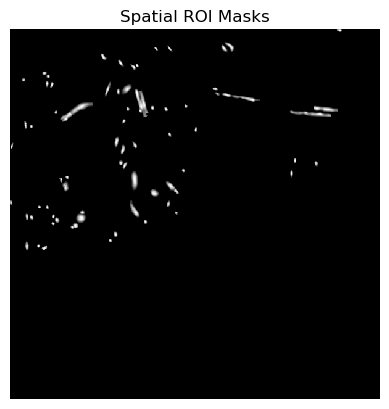

In [3]:

# import h5py
A = np.array(data['A'].values)

try:
    # Convert from sparse to dense if necessary (CSC or CSR format typically)
    from scipy.sparse import csc_matrix
    A_dense = csc_matrix((A.data, A.indices, A.indptr), shape=A.shape).toarray()
except AttributeError:
    # If 'A' is already dense
    A_dense = A

# Sum along the first axis to create a binary image of all ROIs
# This assumes non-overlapping ROIs; if ROIs overlap, this will show overlap areas as brighter
all_rois = np.clip(np.sum(A_dense, axis=0), 0, 1)

# Plot the binary image
# plt.figure(figsize=(10, 10))
plt.imshow(all_rois, cmap='gray', interpolation='nearest')
plt.title('Spatial ROI Masks')
plt.axis('off')  # Turn off axis labels and ticks
plt.show()

# Preface

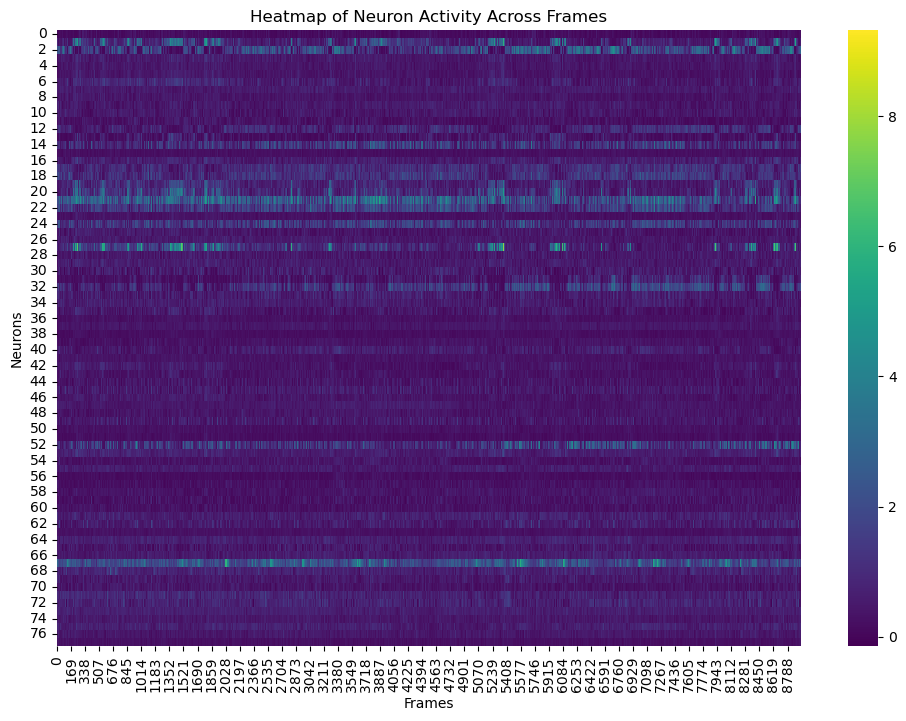

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming data['C'] is already loaded
C = data['C'].values

# Create a figure for the heatmap
plt.figure(figsize=(12, 8))

# Plot a heatmap of the entire C matrix (all neurons and all frames)
sns.heatmap(C, cmap='viridis', cbar=True)

# Labeling the axes
plt.xlabel('Frames')
plt.ylabel('Neurons')
plt.title('Heatmap of Neuron Activity Across Frames')

# Show the heatmap
plt.show()


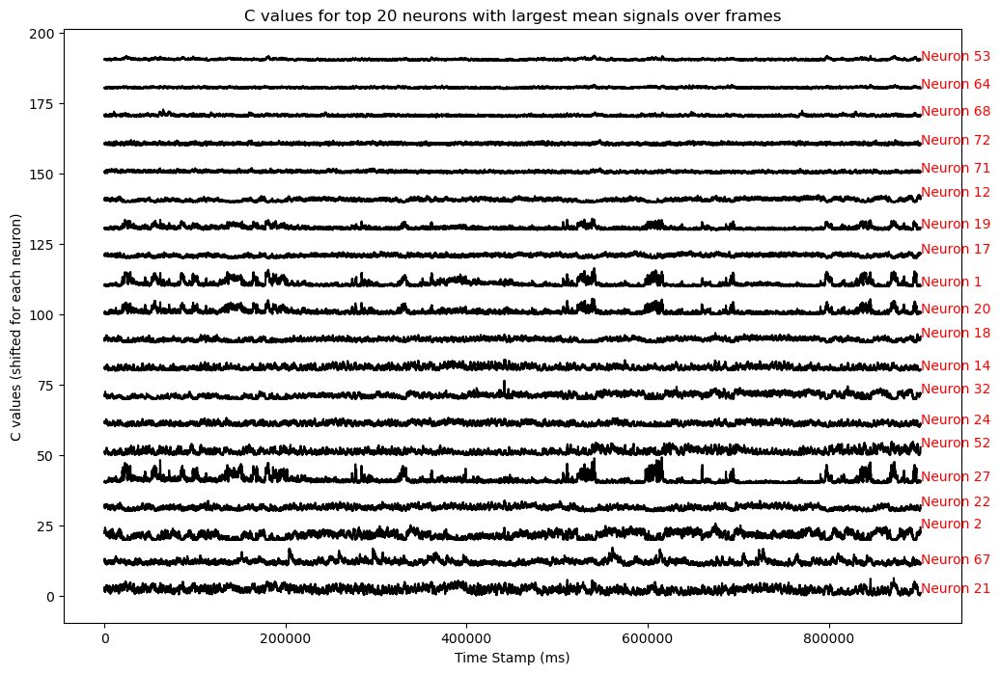

Top 20 neuron indices by mean value:
[21 67  2 22 27 52 24 32 14 18 20  1 17 19 12 71 72 68 64 53]


In [5]:
# this method have a better shifting pattern, thus looks different.
# Extract the 'C' variable
C = data['C'].values

# Get the number of neurons and frames
num_neuron, num_frame = C.shape

# Calculate the mean across frames for each neuron
mean_C = np.mean(C, axis=1)

# Get the indices that would sort the neurons by their mean values in descending order
sorted_indices = np.argsort(mean_C)[::-1]

# Select the top 10-20 neurons (here we choose 20)
top_neurons = 20
selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron, without the neuron#
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 20, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()


# Plot the C values for each selected neuron and print their indices for manual selection
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 20, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
#     plt.text(num_frame - 1, C[neuron_index][-1] + i * 20, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index


# Plot the C values for each selected neuron and print their indices for manual selection, with timestamps
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(ts, C[neuron_index] + i * 10, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
    plt.text(ts[-1], C[neuron_index][-1] + i * 10, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index

plt.xlabel('Time Stamp (ms)')
plt.ylabel('C values (shifted for each neuron)')
plt.title('C values for top 20 neurons with largest mean signals over frames')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean value:")
print(selected_indices)




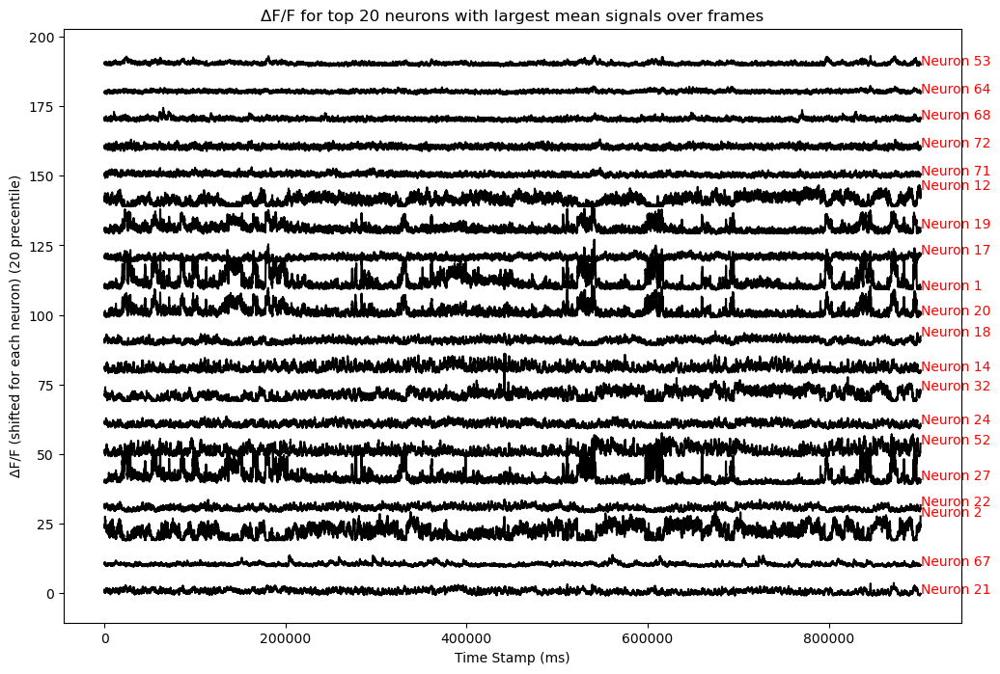

Top 20 neuron indices by mean ΔF/F (20 precentile) value:
[21 67  2 22 27 52 24 32 14 18 20  1 17 19 12 71 72 68 64 53]


In [6]:
# Calculate F0 (the baseline) for each neuron as the 10th percentile of fluorescence
F0 = np.percentile(C, 20, axis=1, keepdims=True)

# Calculate ΔF/F for each neuron
dF_F = (C - F0) / F0

# Plot the ΔF/F values for each selected neuron and print their indices for manual selection, with timestamps
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(ts, dF_F[neuron_index] + i * 10, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
    plt.text(ts[-1], dF_F[neuron_index][-1] + i * 10, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index

plt.xlabel('Time Stamp (ms)')
plt.ylabel('ΔF/F (shifted for each neuron) (20 precentile)')
plt.title('ΔF/F for top 20 neurons with largest mean signals over frames')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F (20 precentile) value:")
print(selected_indices)


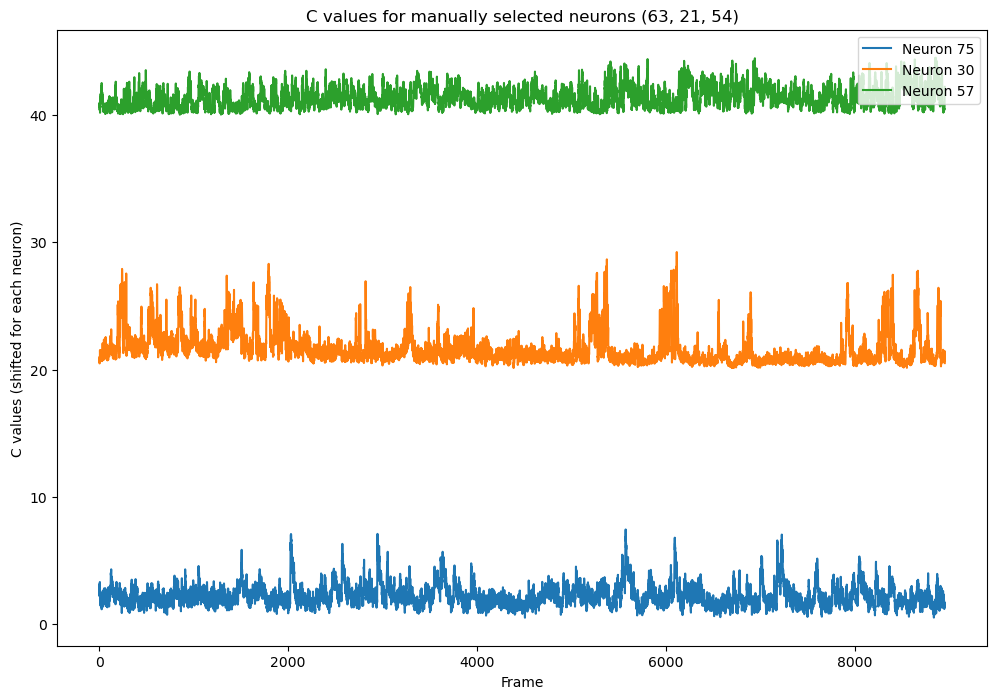

In [10]:
# Assuming these are actual neuron values, not the indices in selected_indices
manual_selection = [75, 30, 57]

# Plot the C values for the manually selected neurons
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(manual_selection):
    plt.plot(C[neuron_index] + i * 20, label=f'Neuron {neuron_index}')  # Add label for each neuron

plt.xlabel('Frame')
plt.ylabel('C values (shifted for each neuron)')
plt.title('C values for manually selected neurons (63, 21, 54)')
plt.legend(loc='upper right')
plt.show()

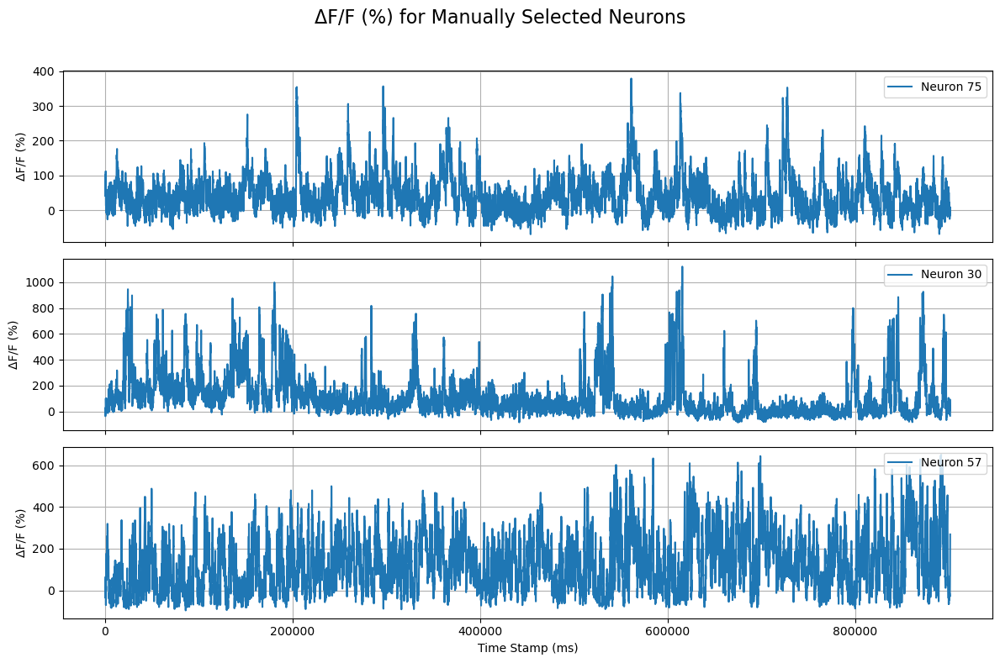

In [11]:
import matplotlib.pyplot as plt

# Assuming 'C' and 'dF_F' are your calcium signals and ΔF/F signals respectively, and 'ts' is the time stamps



# Create subplots, one for each neuron
fig, axes = plt.subplots(len(manual_selection), 1, figsize=(12, 8), sharex=True)

# Plot each neuron in its own subplot
for i, neuron_index in enumerate(manual_selection):
    axes[i].plot(ts, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')
    
    # Add gridlines and label for each subplot
    axes[i].grid(True)
    axes[i].set_ylabel('ΔF/F (%)')
    axes[i].legend(loc='upper right')
    
# Set the x-label on the bottom plot
axes[-1].set_xlabel('Time Stamp (ms)')

# Add a title for the whole figure
fig.suptitle('ΔF/F (%) for Manually Selected Neurons', fontsize=16)

# Automatically adjust the subplot layout to make it readable
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Display the plot
plt.show()


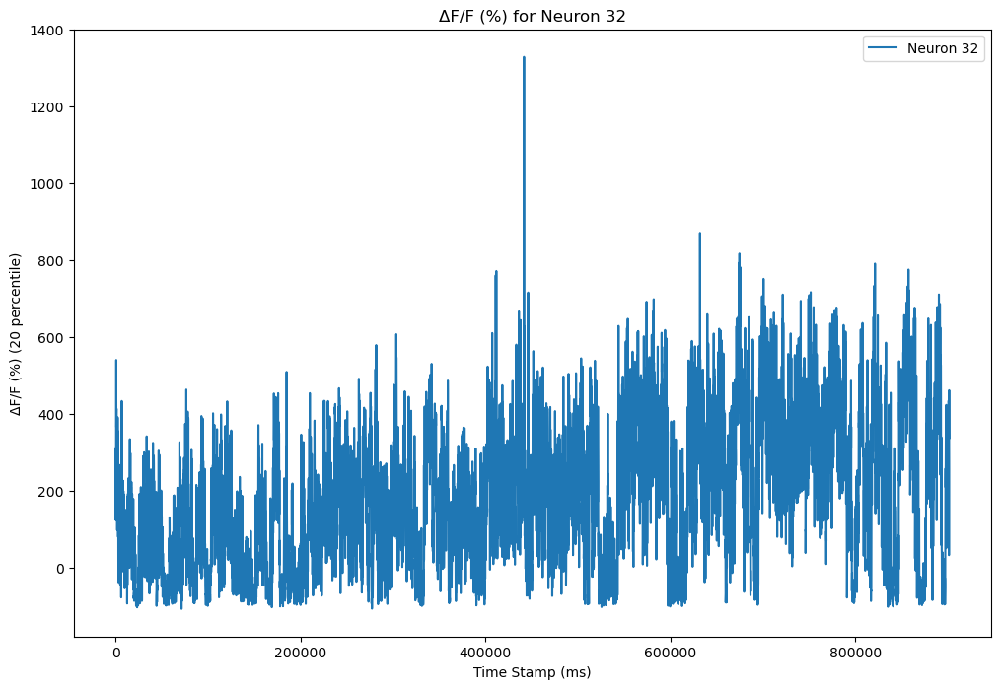

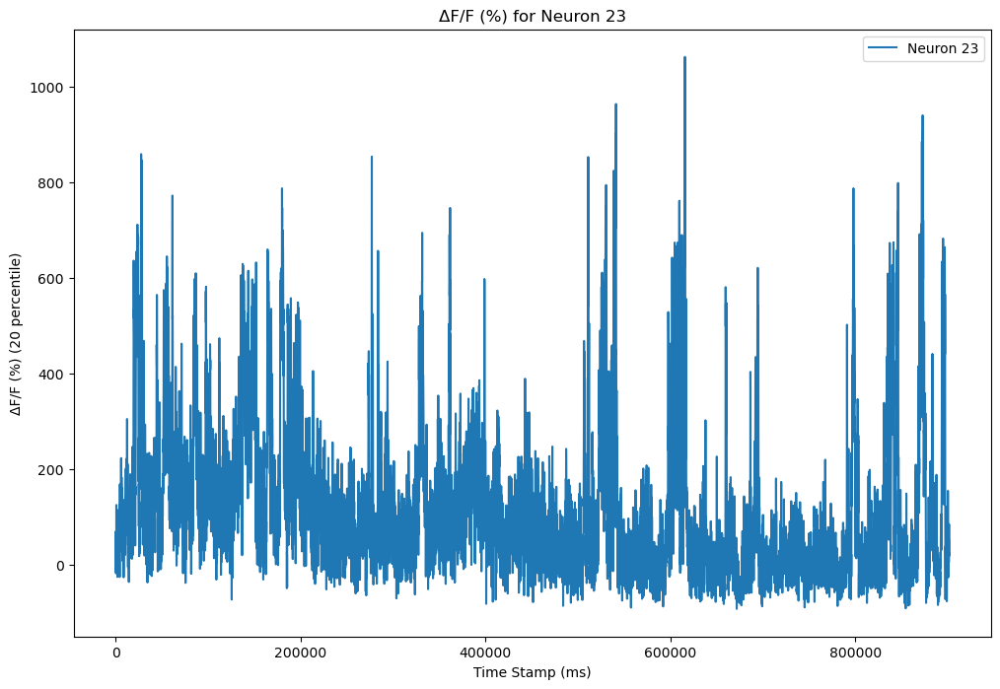

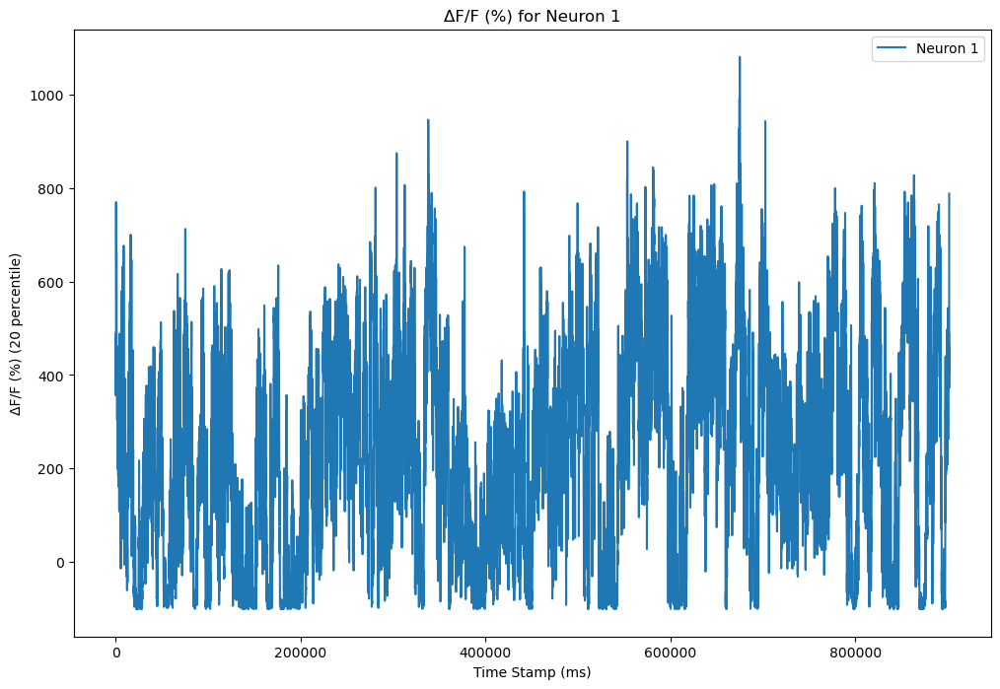

Top 20 neuron indices by mean ΔF/F value:
[34 21 61 38  1 26 25 49 19 33 18 28  0 35 42 23 27 41 12 32]


In [13]:
# Plot the ΔF/F values for each selected neuron without shifting
# manual_selection.append(14)
# plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # plt.plot(ts, dF_F[neuron_index]*100, label=f'Neuron {neuron_index}')  # No shifting

    plt.figure(figsize=(12, 8))
    plt.plot(ts, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    plt.xlabel('Time Stamp (ms)')
    plt.ylabel('ΔF/F (%) (20 percentile)')
    plt.title(f'ΔF/F (%) for Neuron {neuron_index}')
    plt.legend(loc='upper right')
    plt.show()

# plt.xlabel('Time Stamp (ms)')
# plt.ylabel('ΔF/F (%) (20 percentile)')
# plt.title('ΔF/F (%) for top 20 neurons with largest mean signals over frames')
# plt.legend(loc='upper right')
# plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


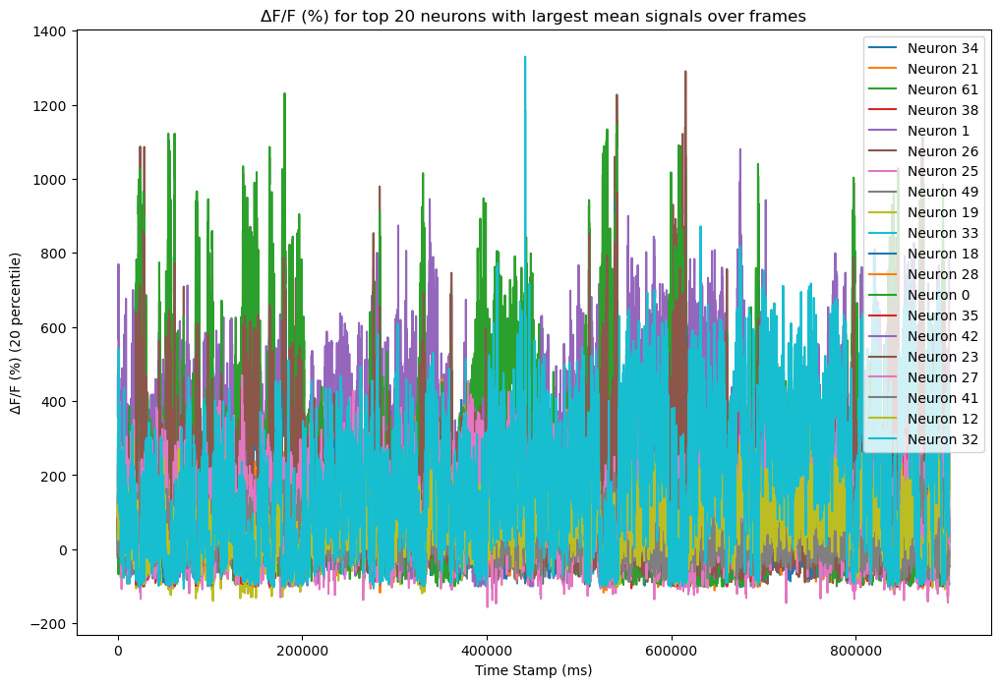

Top 20 neuron indices by mean ΔF/F value:
[34 21 61 38  1 26 25 49 19 33 18 28  0 35 42 23 27 41 12 32]


In [7]:
# Plot the ΔF/F values for each selected neuron without shifting
plt.figure(figsize=(12, 8))
for neuron_index in selected_indices:
    plt.plot(ts, dF_F[neuron_index]*100, label=f'Neuron {neuron_index}')  # No shifting

plt.xlabel('Time Stamp (ms)')
plt.ylabel('ΔF/F (%) (20 percentile)')
plt.title('ΔF/F (%) for top 20 neurons with largest mean signals over frames')
plt.legend(loc='upper right')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


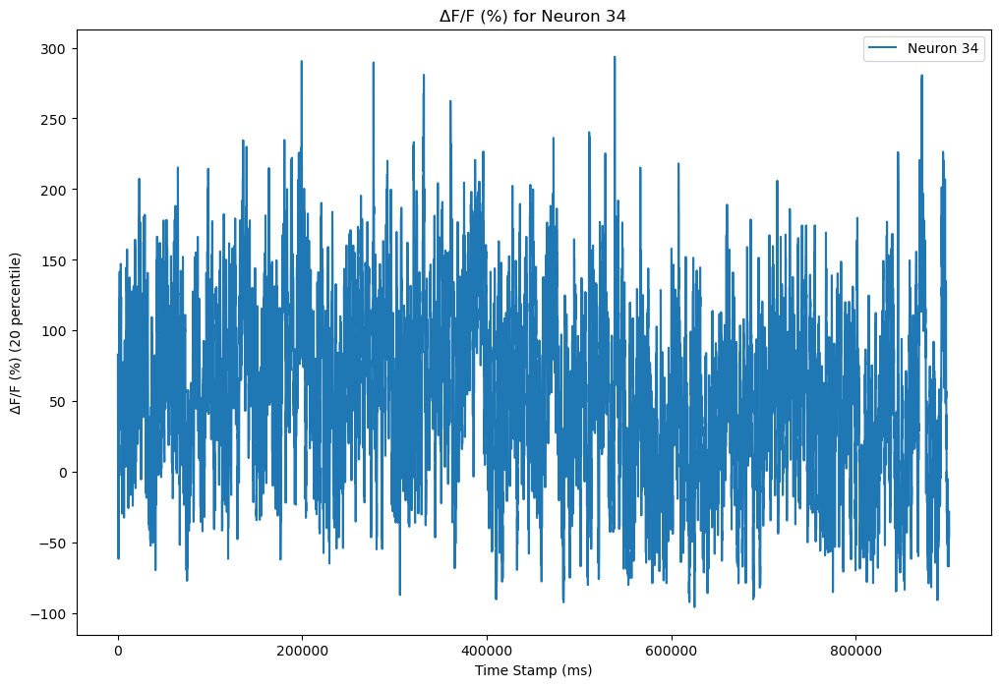

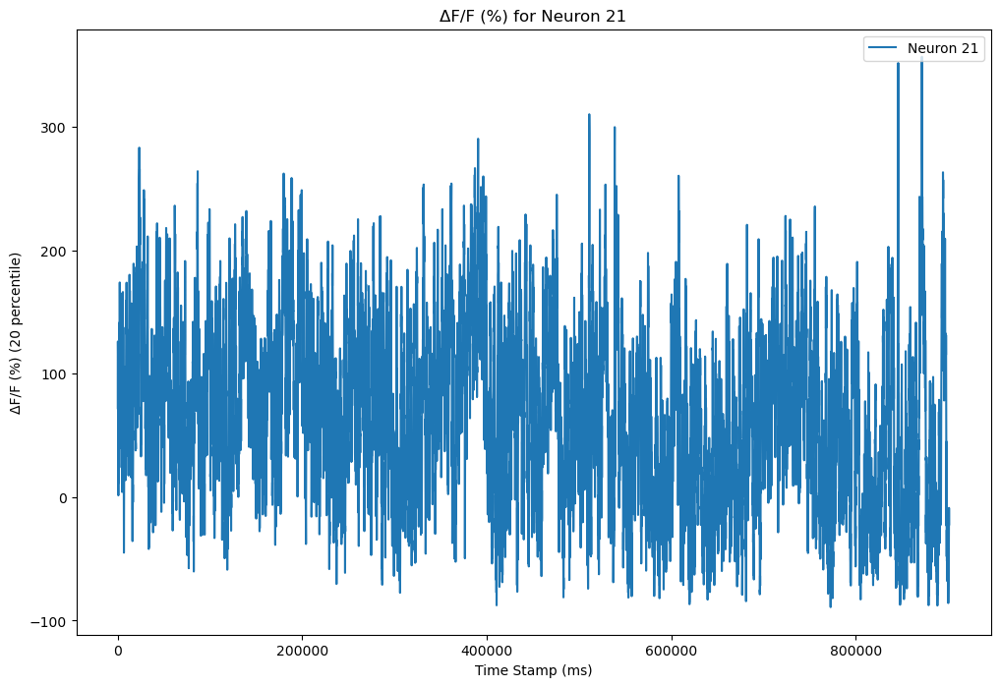

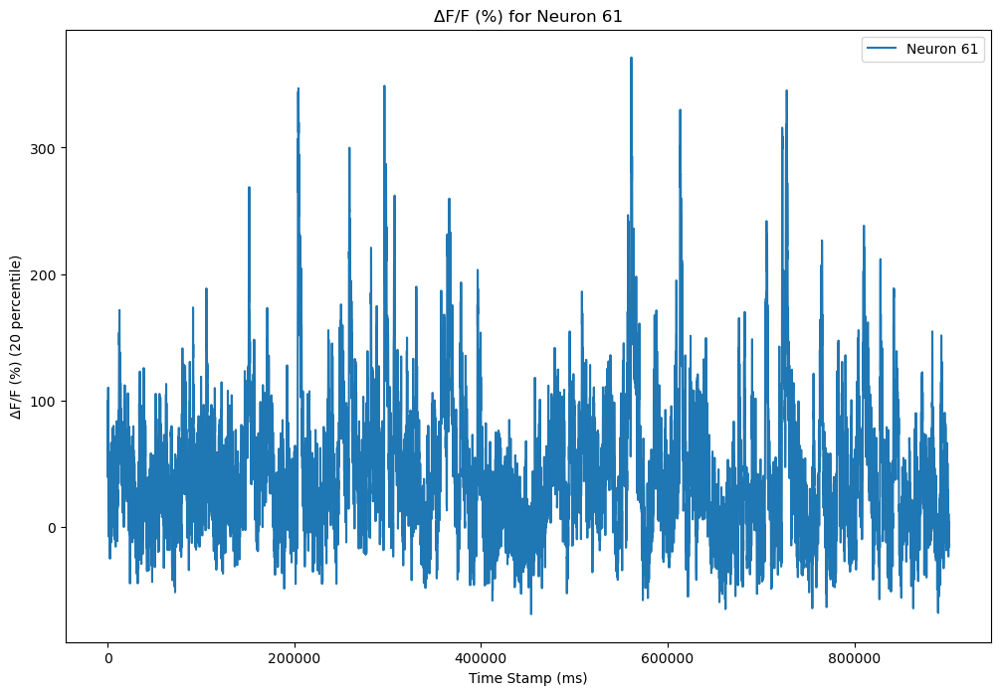

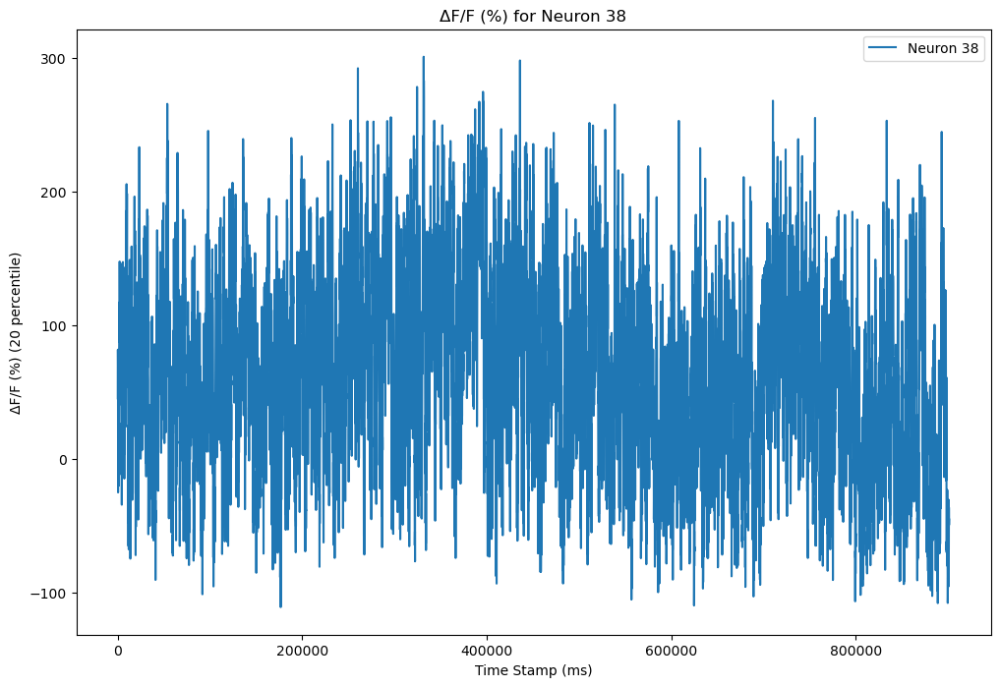

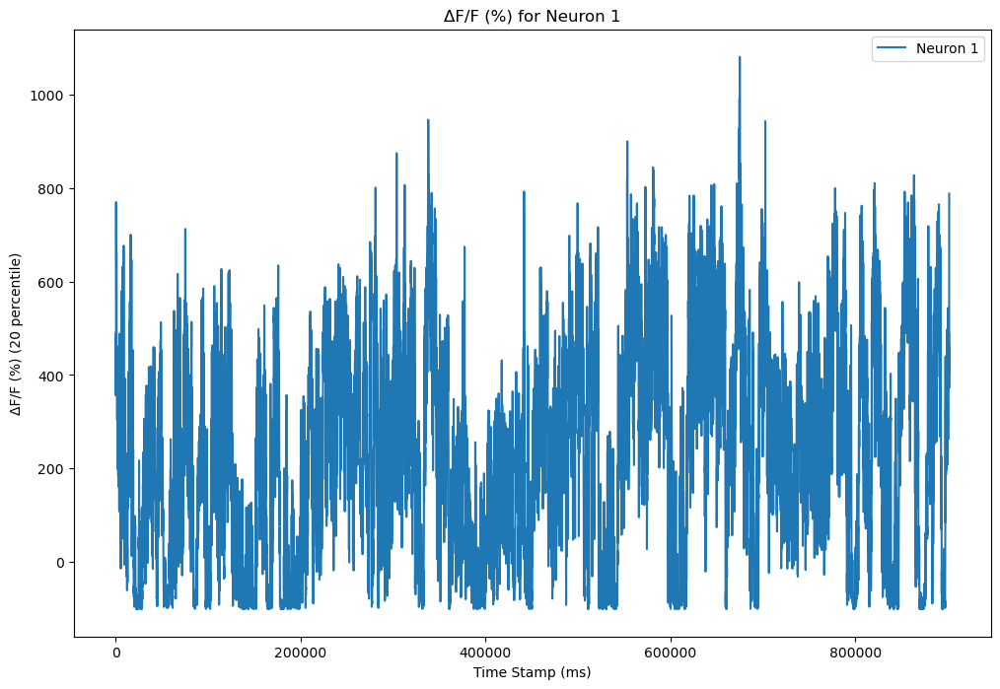

...

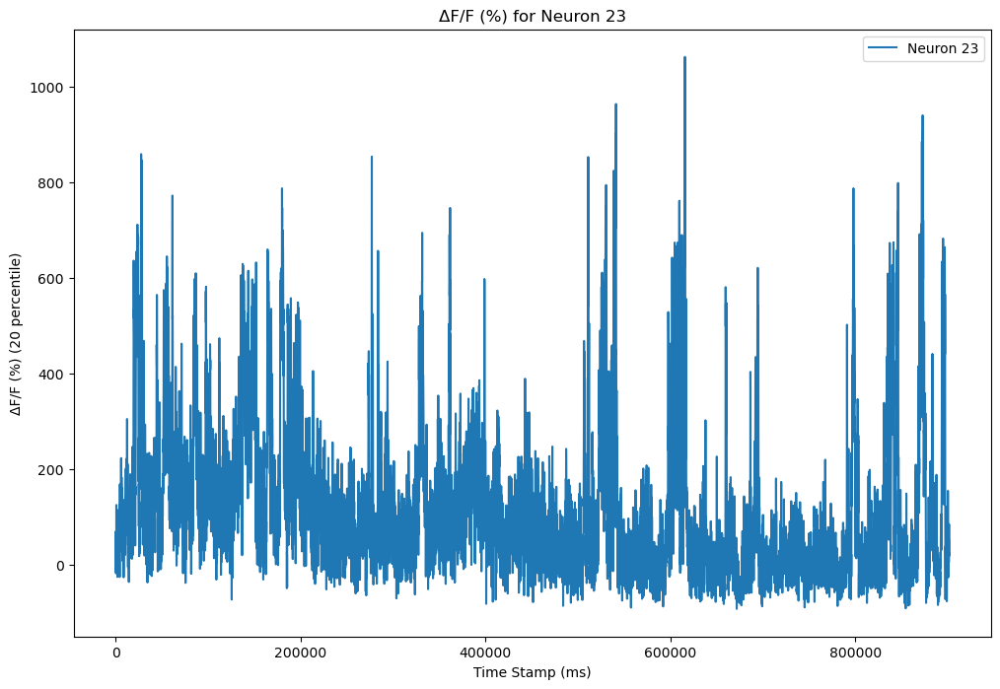

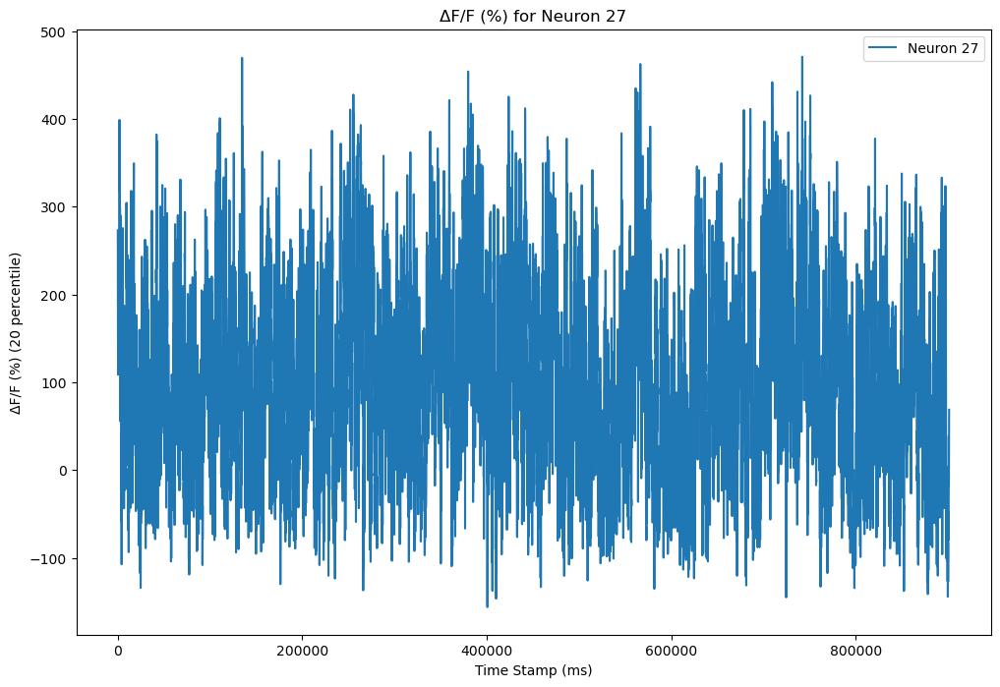

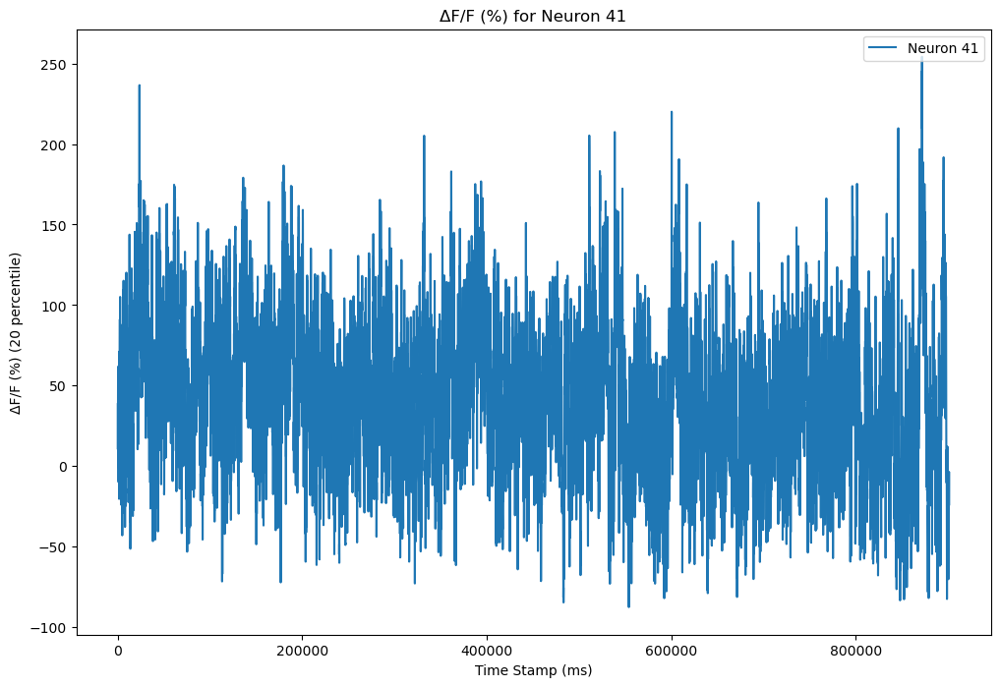

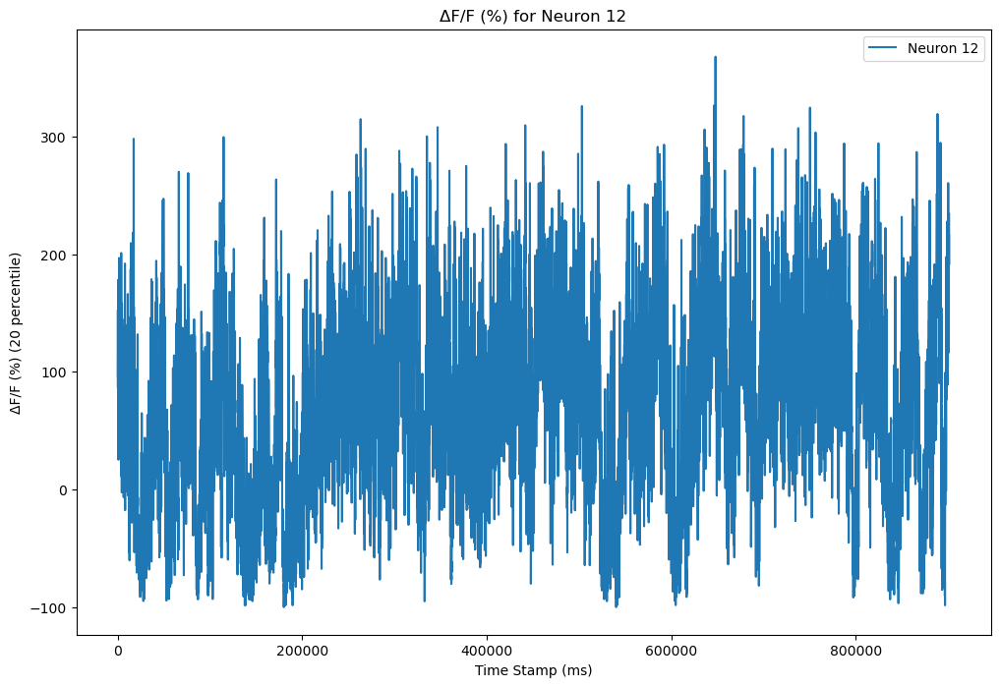

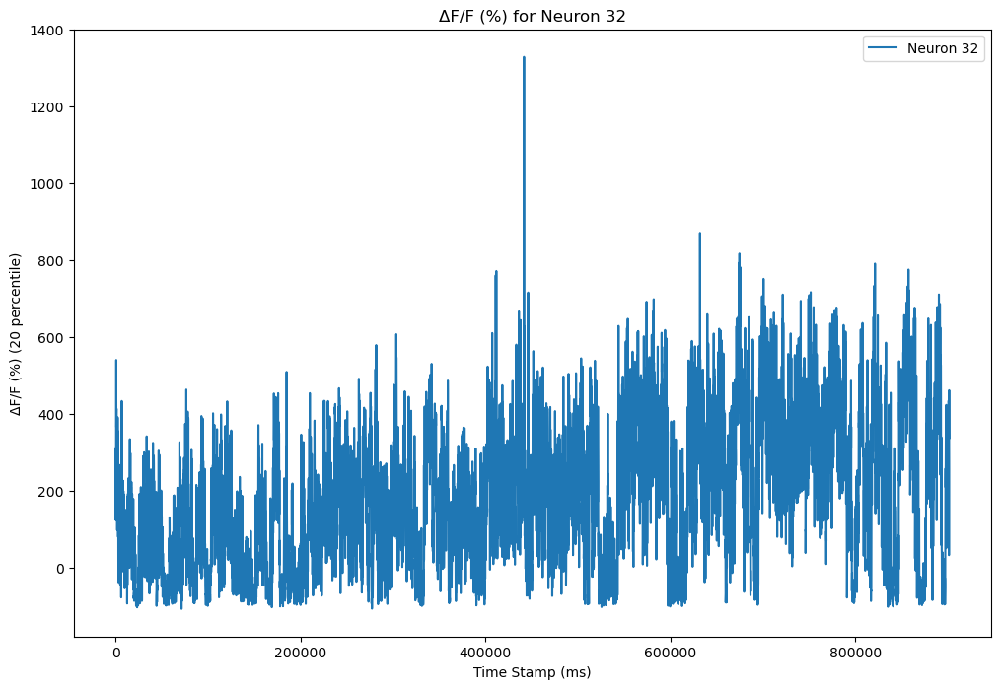

Top 20 neuron indices by mean ΔF/F value:
[34 21 61 38  1 26 25 49 19 33 18 28  0 35 42 23 27 41 12 32]


In [10]:
# Plot the ΔF/F values for each selected neuron without shifting
# manual_selection.append(14)
# plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in selected_indices:
    # plt.plot(ts, dF_F[neuron_index]*100, label=f'Neuron {neuron_index}')  # No shifting

    plt.figure(figsize=(12, 8))
    plt.plot(ts, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    plt.xlabel('Time Stamp (ms)')
    plt.ylabel('ΔF/F (%) (20 percentile)')
    plt.title(f'ΔF/F (%) for Neuron {neuron_index}')
    plt.legend(loc='upper right')
    plt.show()

# plt.xlabel('Time Stamp (ms)')
# plt.ylabel('ΔF/F (%) (20 percentile)')
# plt.title('ΔF/F (%) for top 20 neurons with largest mean signals over frames')
# plt.legend(loc='upper right')
# plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


In [9]:
manual_selection.append(14)
plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # Create a new figure for each neuron
    plt.figure(figsize=(12, 8))
    plt.plot(ts, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    plt.xlabel('Time Stamp (ms)')
    plt.ylabel('ΔF/F (%) (20 percentile)')
    plt.title(f'ΔF/F (%) for Neuron {neuron_index}')
    plt.legend(loc='upper right')
    plt.grid(True)  # Add grid lines
    plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


NameError: name 'manual_selection' is not defined

<Figure size 1200x800 with 0 Axes>

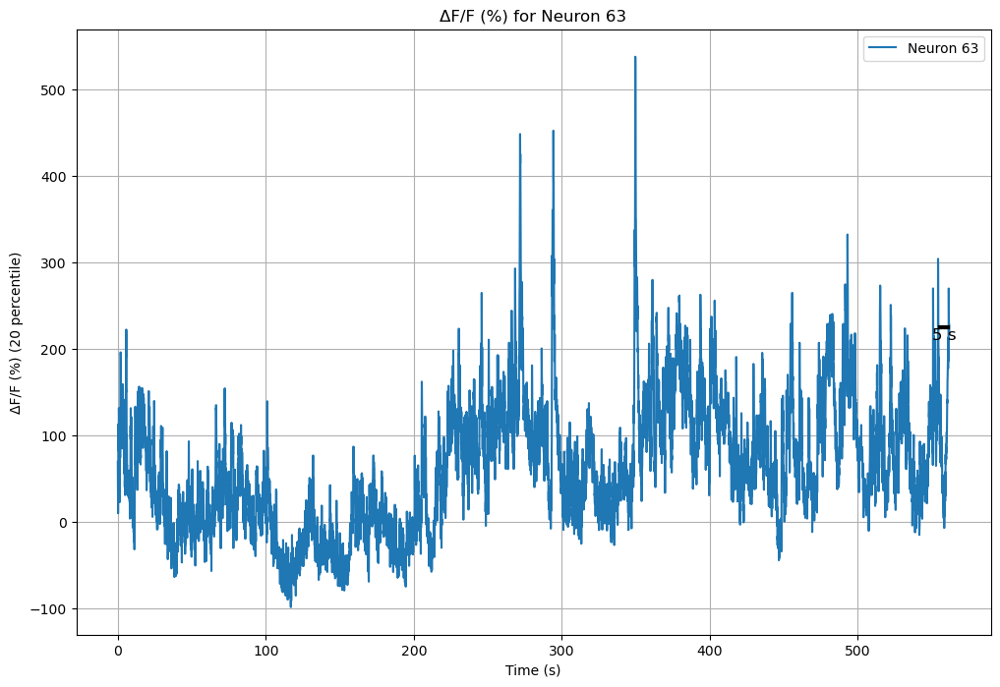

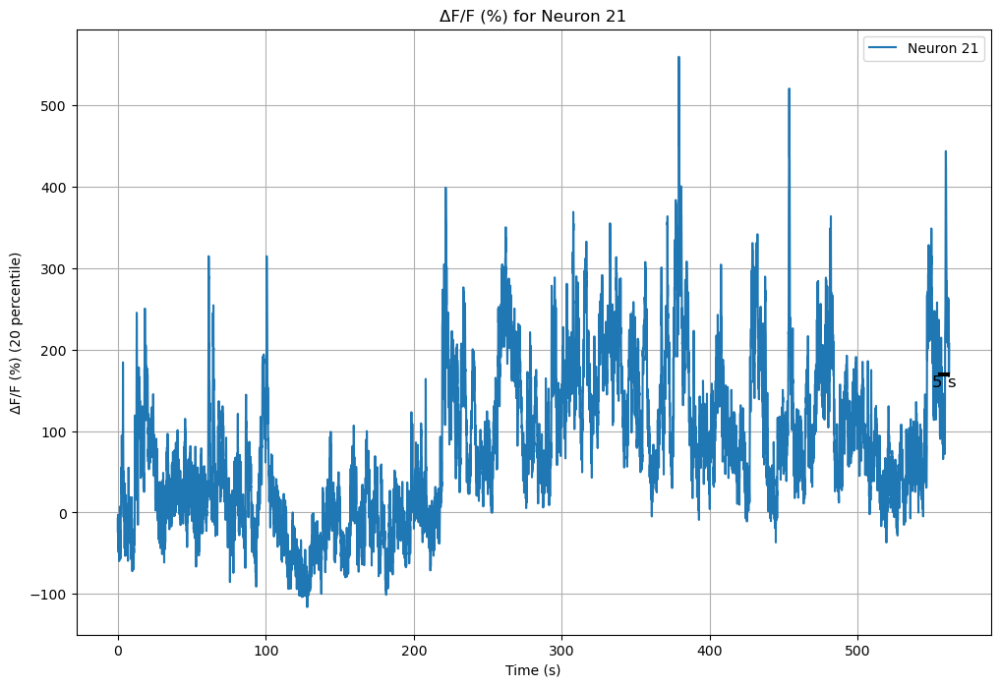

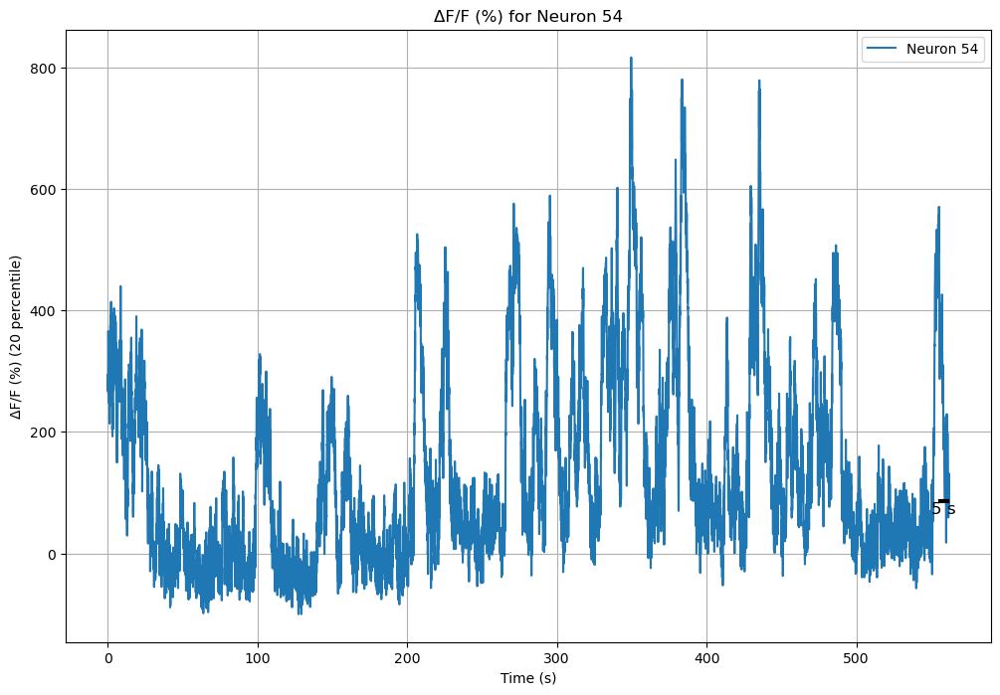

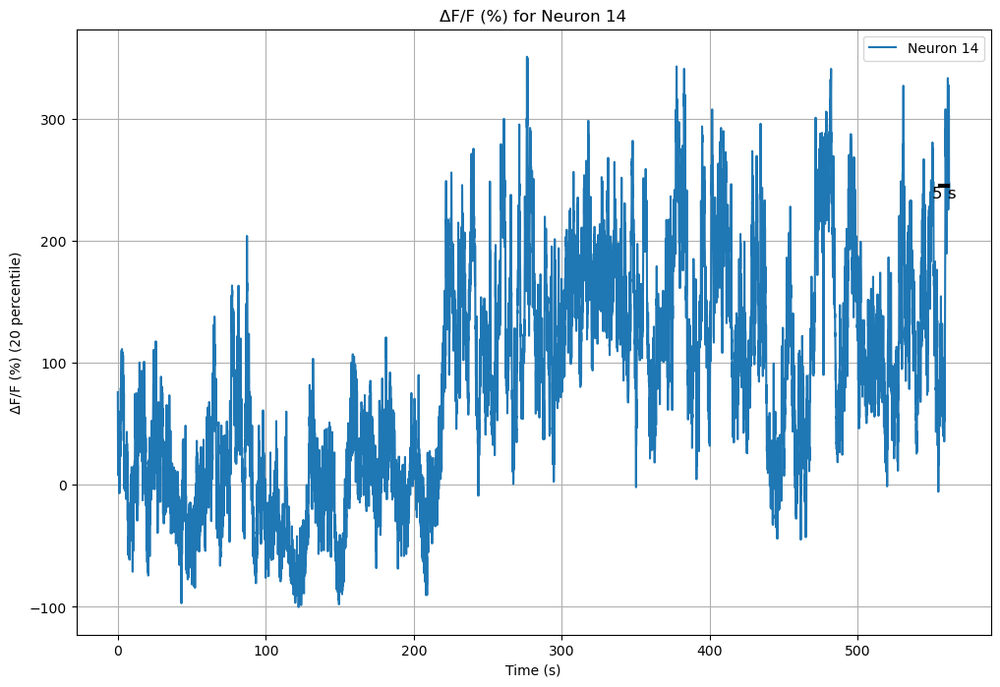

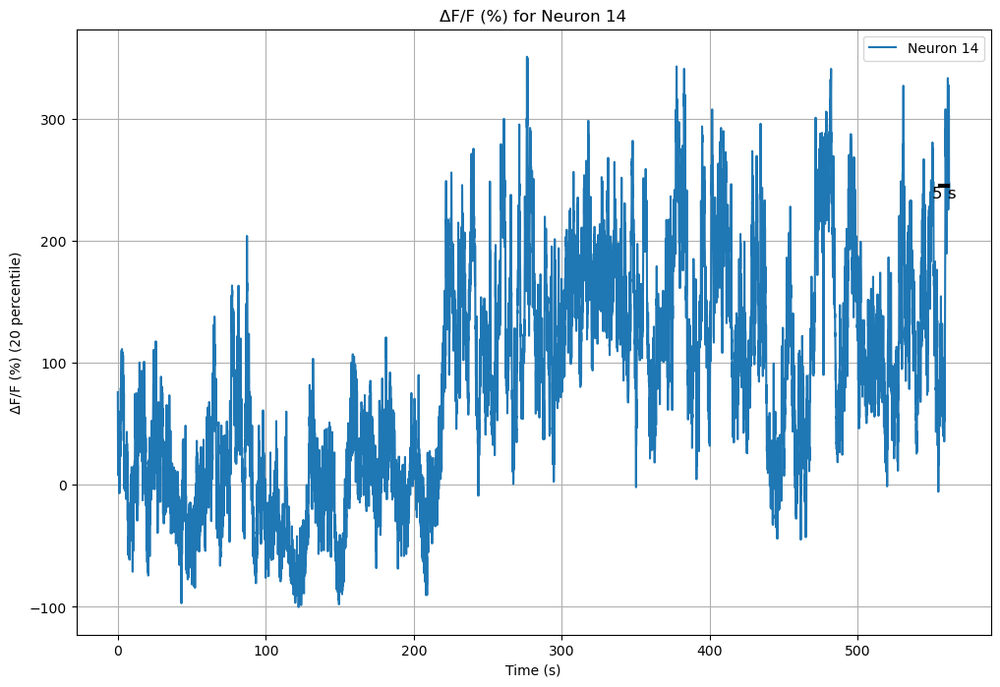

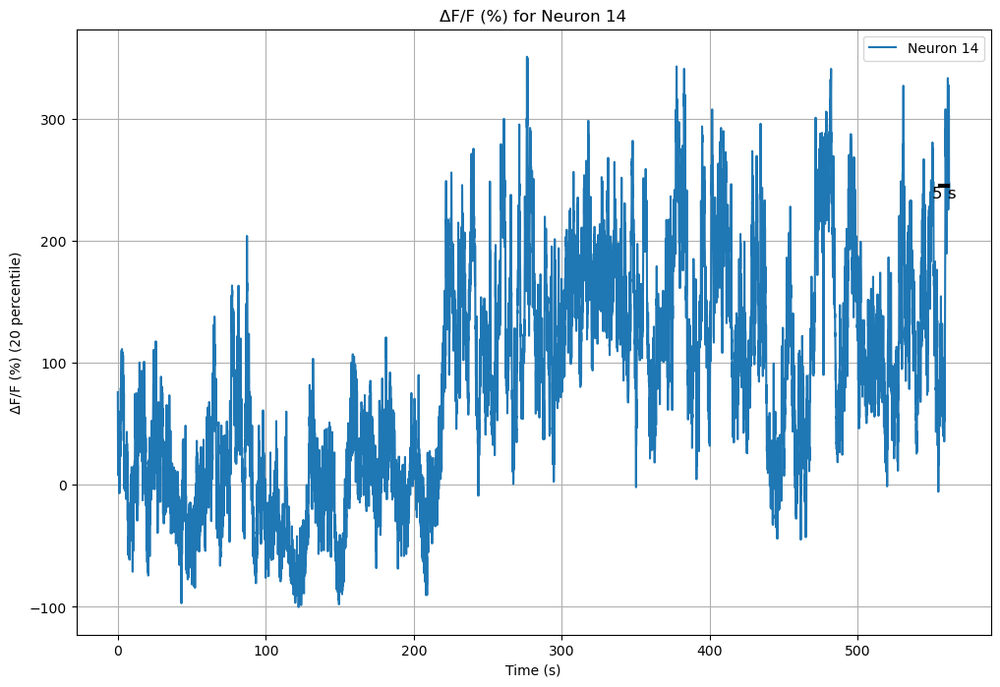

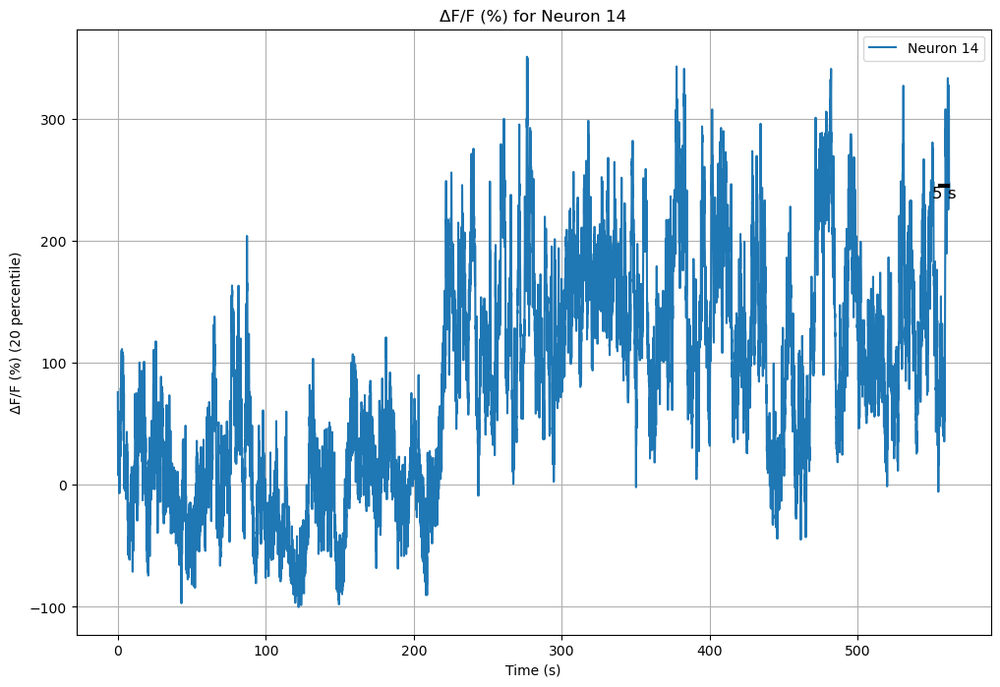

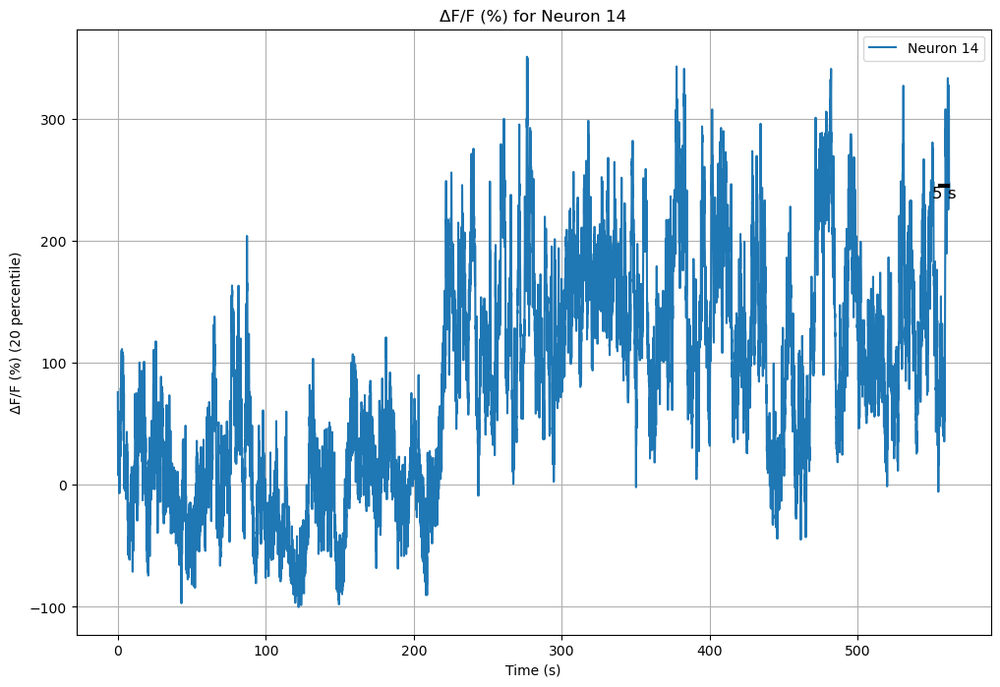

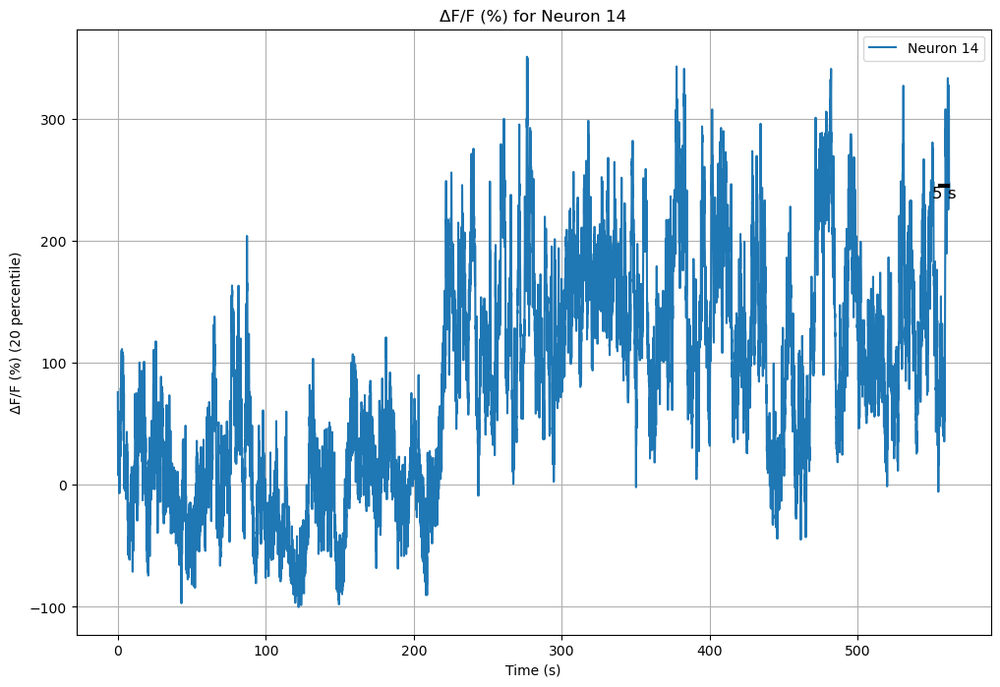

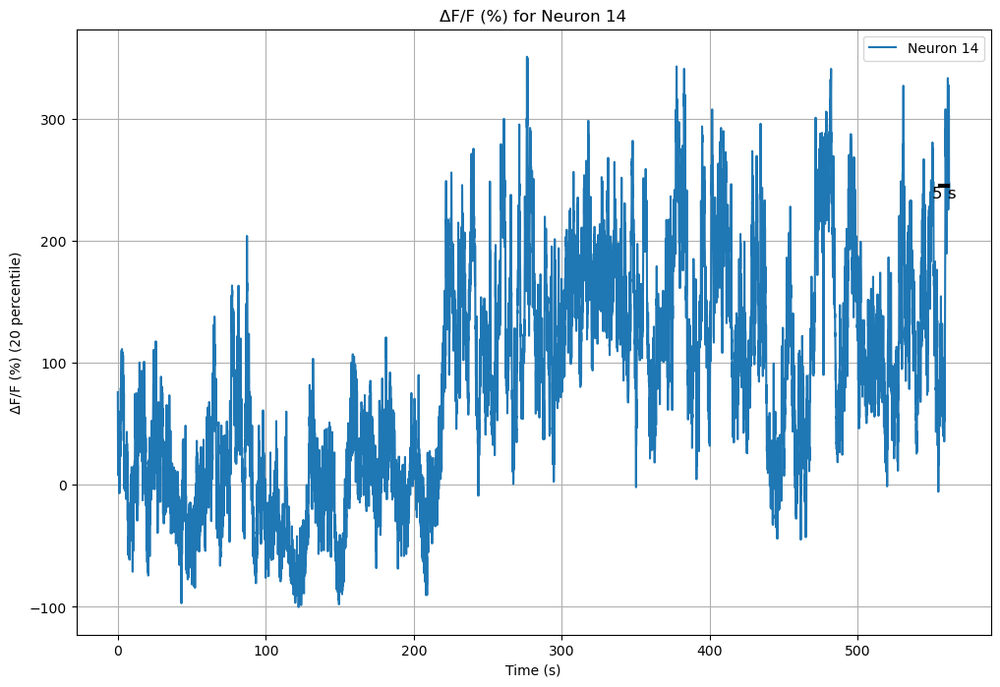

Top 20 neuron indices by mean ΔF/F value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [28]:
import matplotlib.patches as patches

# Convert time units (choose between 's' for seconds or 'min' for minutes)
time_unit = 's'  # Change this to 'min' if you want time in minutes
ts_in_seconds = ts / 1000  # Convert from milliseconds to seconds
if time_unit == 'min':
    ts_in_seconds = ts_in_seconds / 60  # Convert seconds to minutes

manual_selection.append(14)
plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # Create a new figure for each neuron
    plt.figure(figsize=(12, 8))
    plt.plot(ts_in_seconds, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    
    # Set x-axis label depending on the time unit
    if time_unit == 's':
        plt.xlabel('Time (s)')  # X-axis in seconds
    else:
        plt.xlabel('Time (min)')  # X-axis in minutes

    plt.ylabel('ΔF/F (%) (20 percentile)')
    plt.title(f'ΔF/F (%) for Neuron {neuron_index}')
    plt.legend(loc='upper right')
    
    # Add grid lines
    plt.grid(True)

    # Add a more prominent scale bar
    if time_unit == 's':
        scalebar_length = 5  # Define length of the scale bar in seconds
    else:
        scalebar_length = 0.1  # Define length of the scale bar in minutes

    scalebar_height_percent = 2  # Define the height of the scale bar in ΔF/F (%)

    # Create a thick scale bar line
    ax = plt.gca()  # Get current axis
    scalebar_x = ts_in_seconds[-1] - scalebar_length - 1  # Adjust the x position
    scalebar_y = dF_F[neuron_index][-1] * 100 - scalebar_height_percent

    # Add a horizontal scale bar
    plt.plot([scalebar_x, scalebar_x + scalebar_length], [scalebar_y, scalebar_y], 
             color='black', lw=3)  # Thicker line for better visibility

    # Add label for the scale bar
    if time_unit == 's':
        plt.text(scalebar_x + scalebar_length / 2, scalebar_y - 0.5, f'{scalebar_length} s', 
                 ha='center', va='top', fontsize=12, color='black')
    else:
        plt.text(scalebar_x + scalebar_length / 2, scalebar_y - 0.5, f'{scalebar_length} min', 
                 ha='center', va='top', fontsize=12, color='black')

    # Show the plot
    plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


<Figure size 1200x800 with 0 Axes>

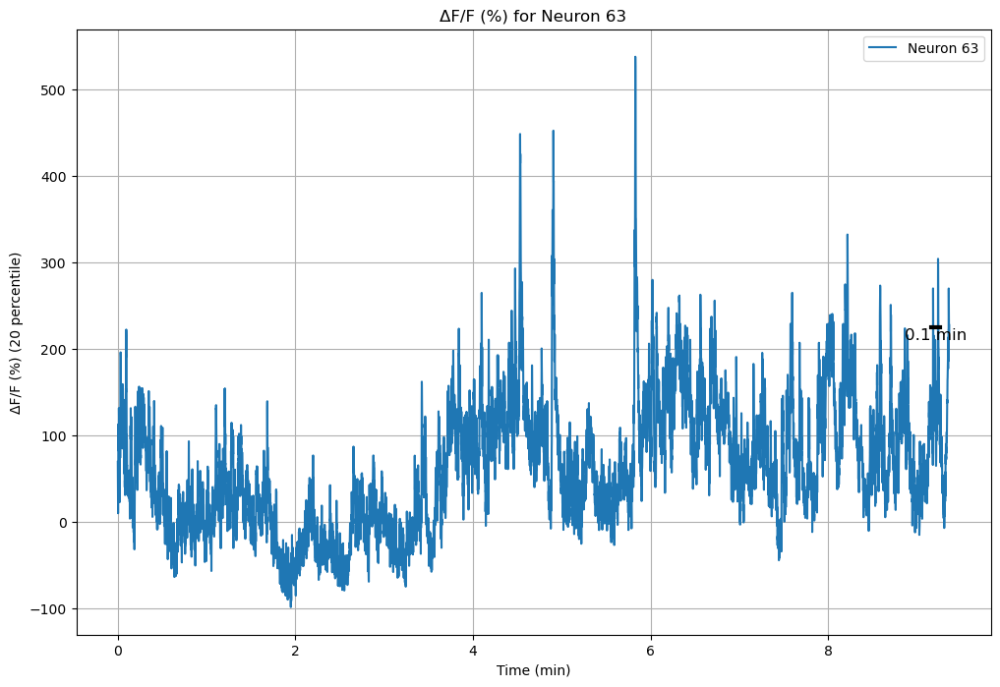

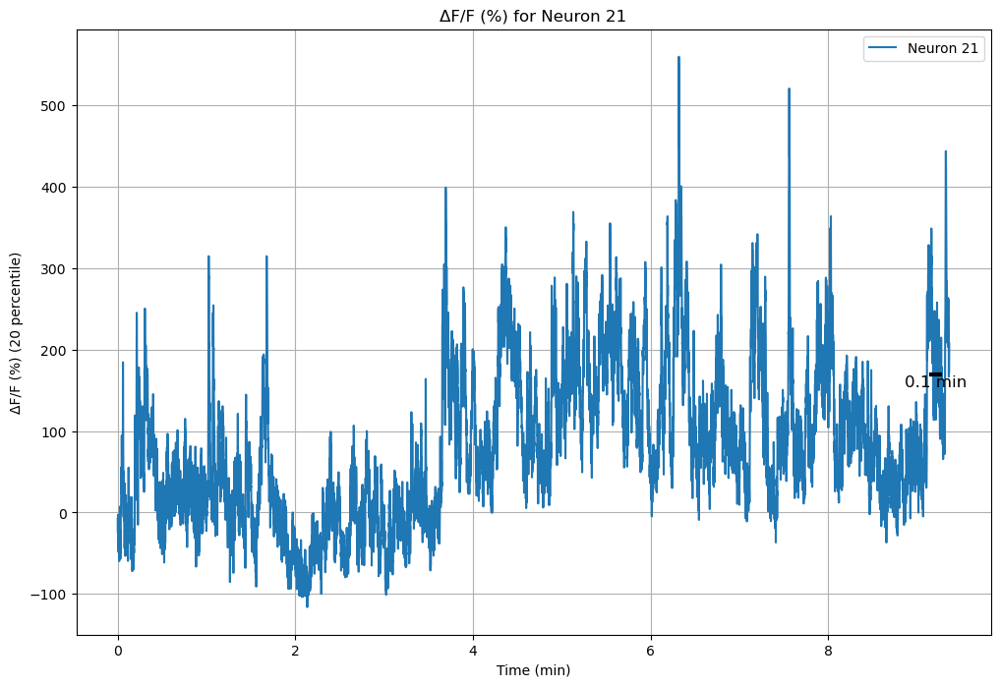

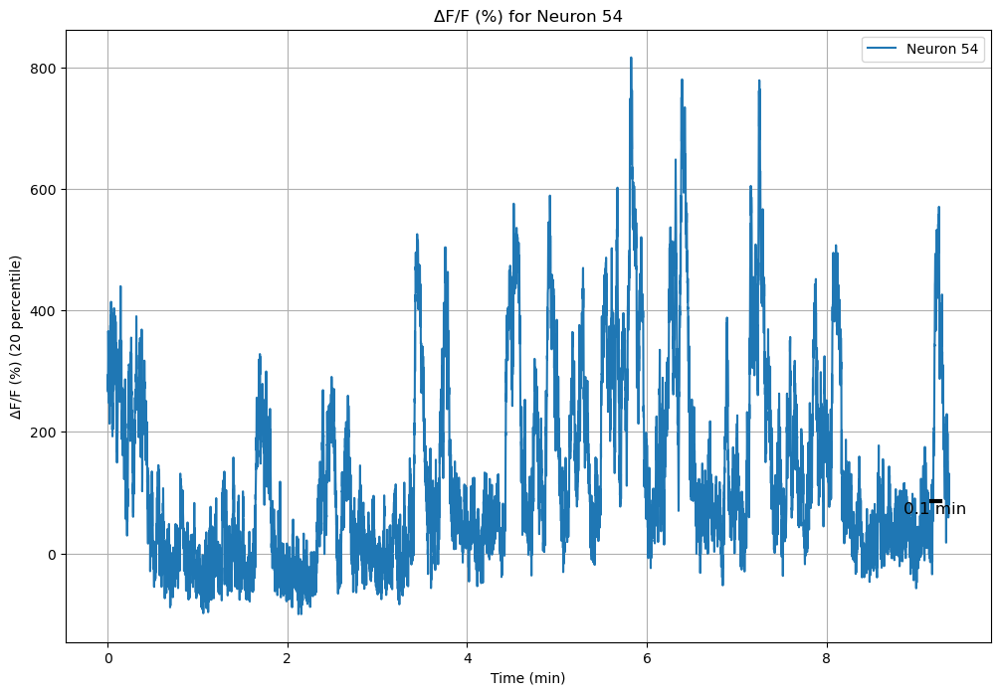

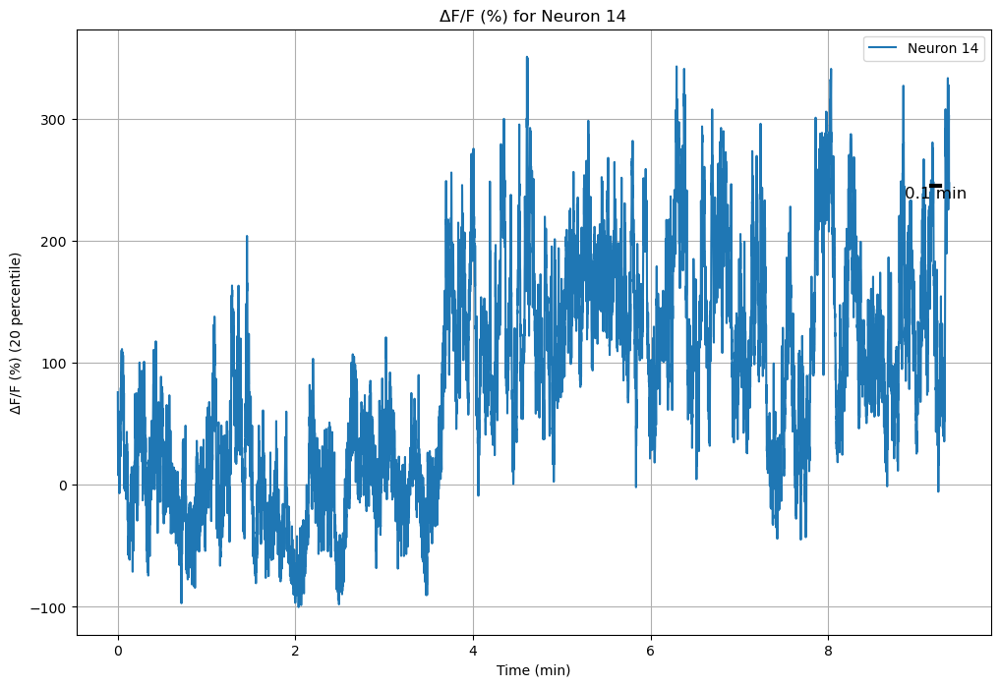

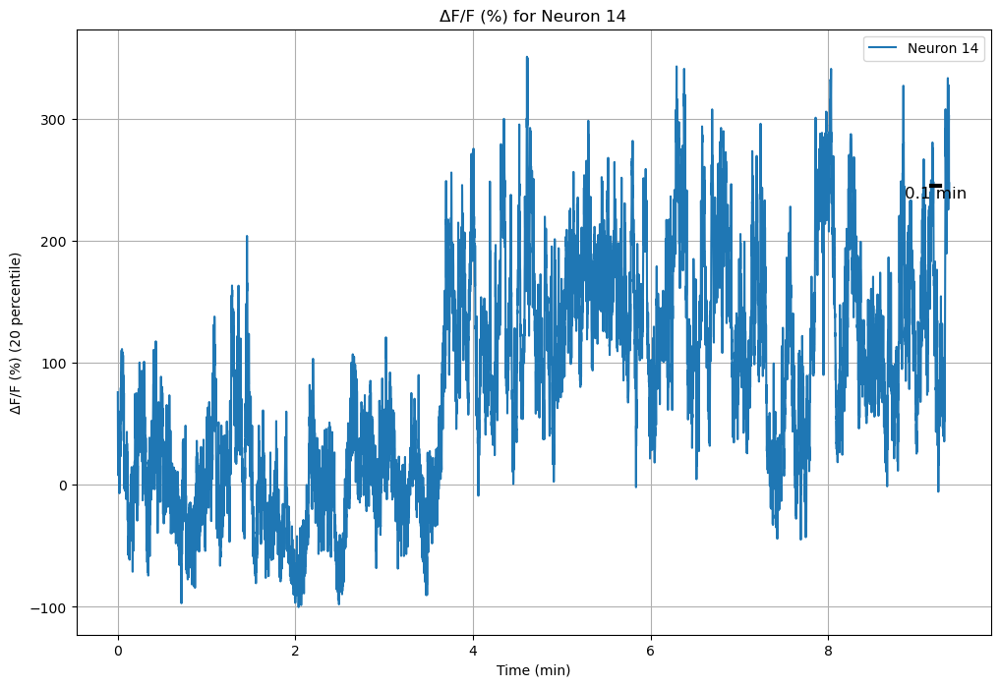

...

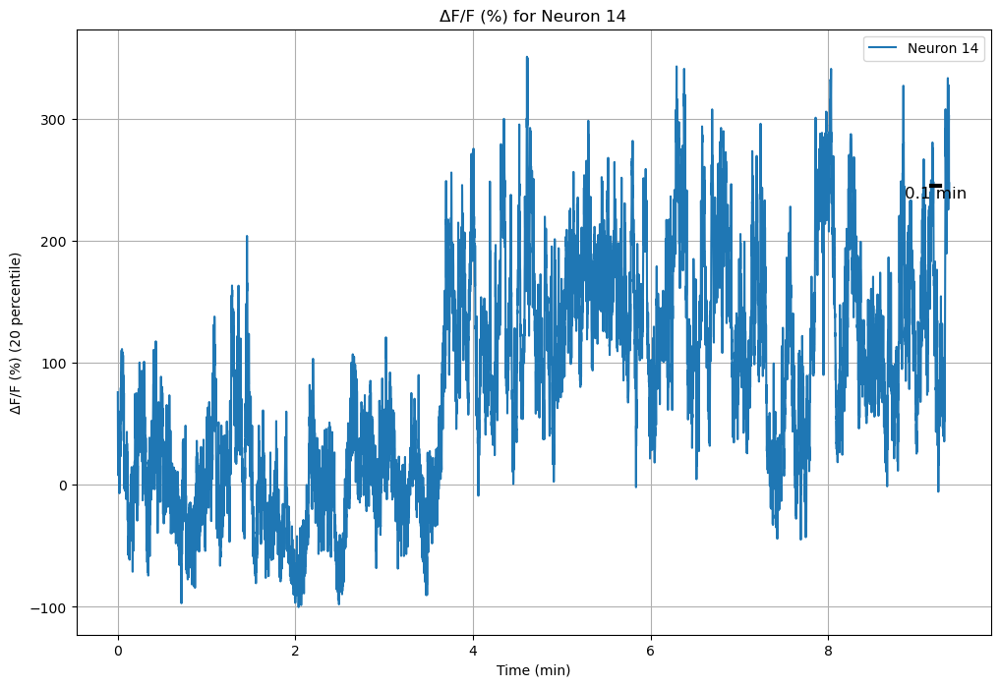

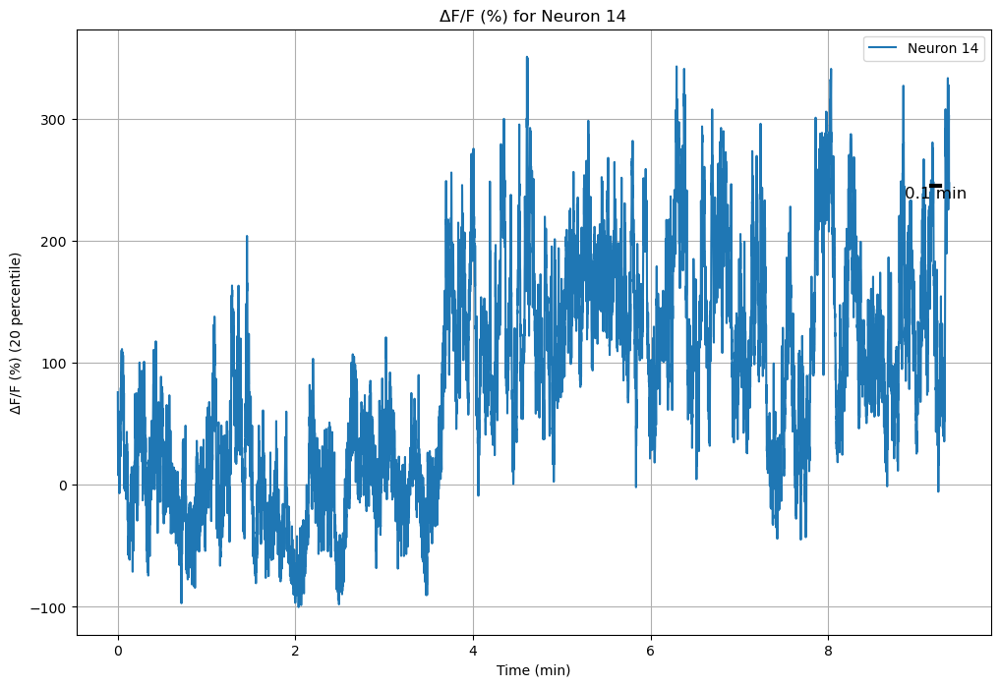

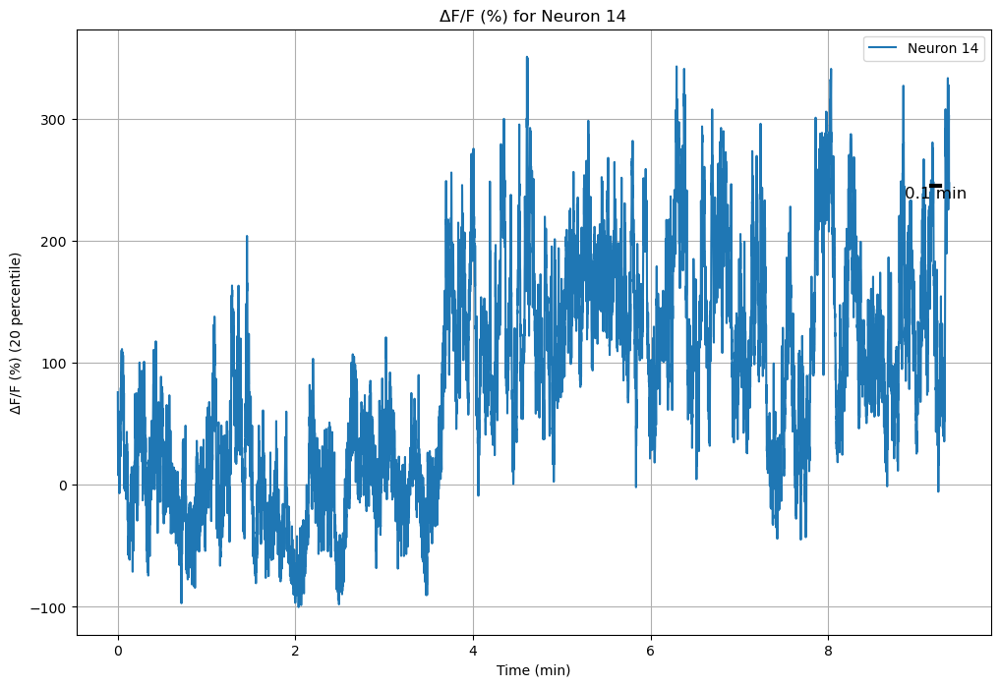

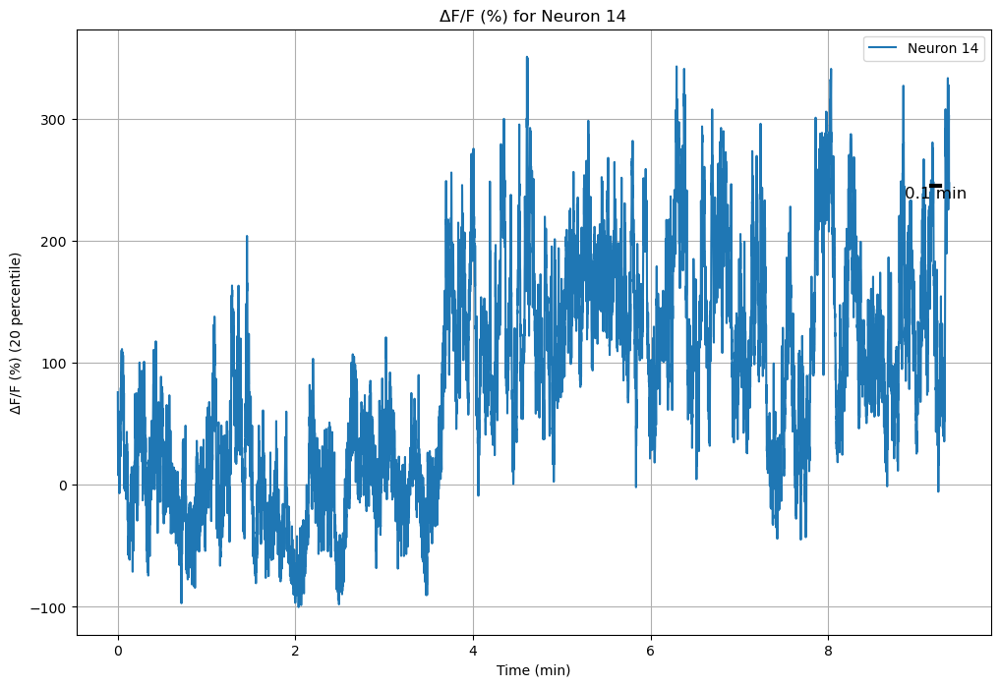

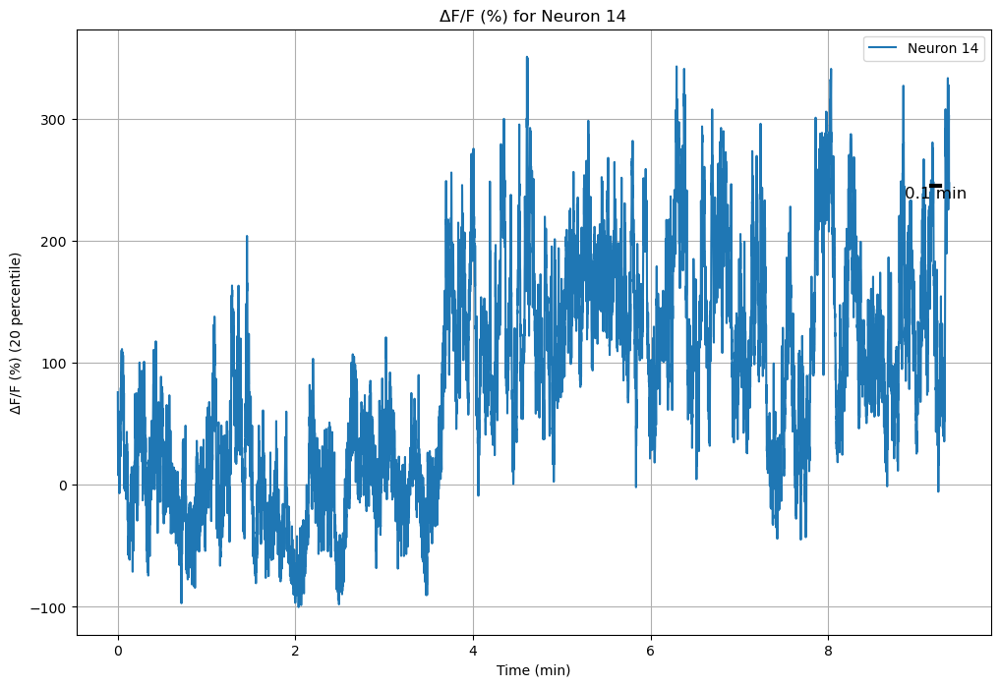

Top 20 neuron indices by mean ΔF/F value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [32]:
import matplotlib.patches as patches

# Convert time units to minutes
time_unit = 'min'  # Time is displayed in minutes
ts_in_minutes = ts / 1000 / 60  # Convert from milliseconds to minutes

manual_selection.append(14)
plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # Create a new figure for each neuron
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(ts_in_minutes, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    
    # Set x-axis label to minutes
    ax.set_xlabel('Time (min)')  # X-axis in minutes
    ax.set_ylabel('ΔF/F (%) (20 percentile)')
    ax.set_title(f'ΔF/F (%) for Neuron {neuron_index}')
    
    # Add legend
    legend = ax.legend(loc='upper right')

    # Add grid lines
    ax.grid(True)

    # Add a more prominent scale bar in the same area as the legend
    scalebar_length_min = 0.1  # Define length of the scale bar in minutes
    scalebar_height_percent = 2  # Define the height offset for the scale bar in ΔF/F (%)
    
    # Draw the figure to render the plot and legend (necessary for the renderer)
    fig.canvas.draw()

    # Get legend position for reference
    legend_box = legend.get_window_extent(renderer=fig.canvas.get_renderer())
    
    # Get axis limits
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    
    # Place the scale bar near the top right, same height as the neuron label
    scalebar_x = ts_in_minutes[-1] - scalebar_length_min - 0.1  # Adjust the x position
    scalebar_y = dF_F[neuron_index][-1] * 100 - scalebar_height_percent

    # Add horizontal scale bar
    ax.plot([scalebar_x, scalebar_x + scalebar_length_min], [scalebar_y, scalebar_y], 
             color='black', lw=3)  # Thicker line for better visibility

    # Add label for the scale bar
    ax.text(scalebar_x + scalebar_length_min / 2, scalebar_y - 0.5, f'{scalebar_length_min} min', 
            ha='center', va='top', fontsize=12, color='black')

    # Show the plot
    plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


<Figure size 1200x800 with 0 Axes>

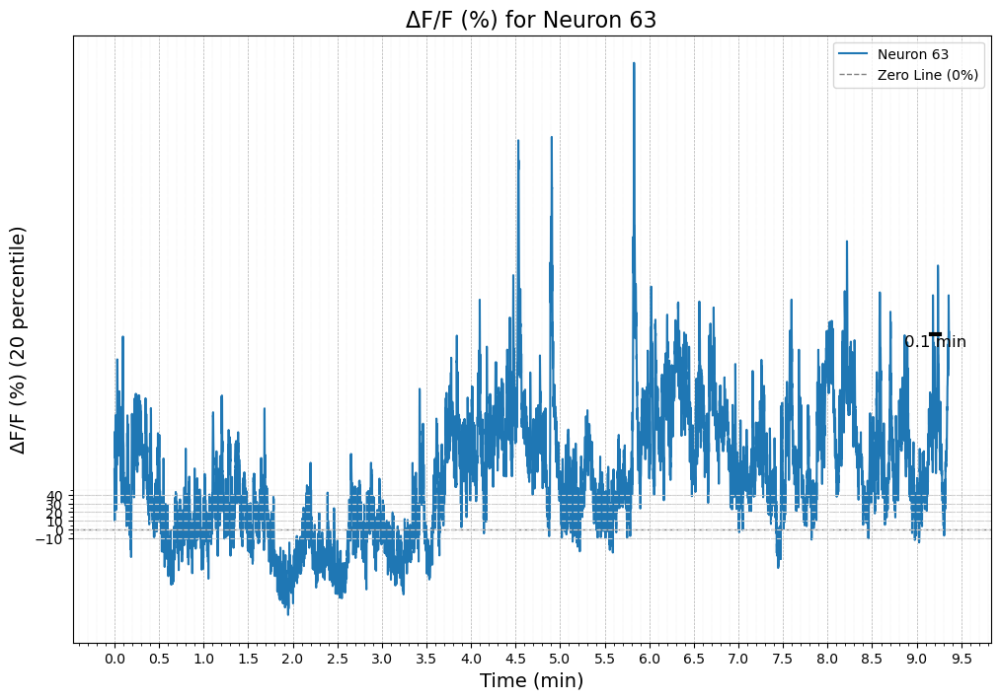

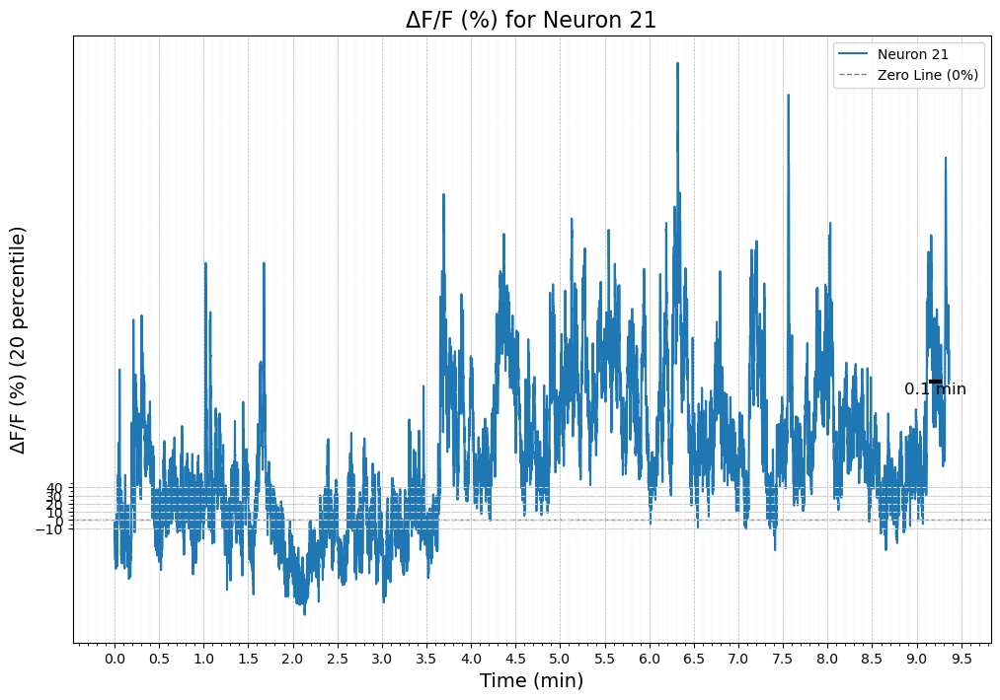

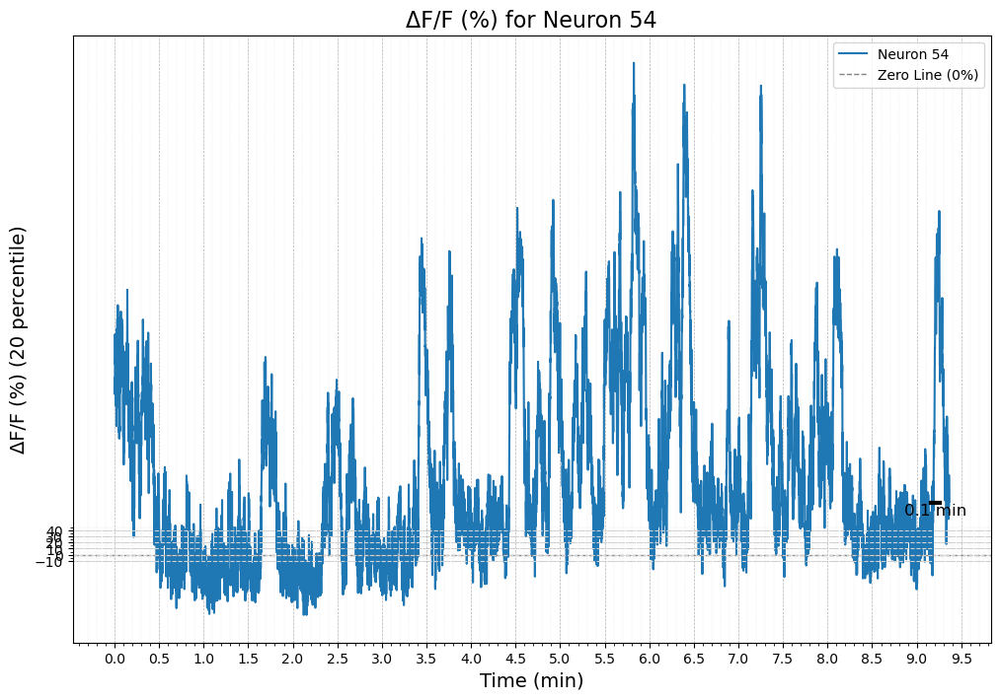

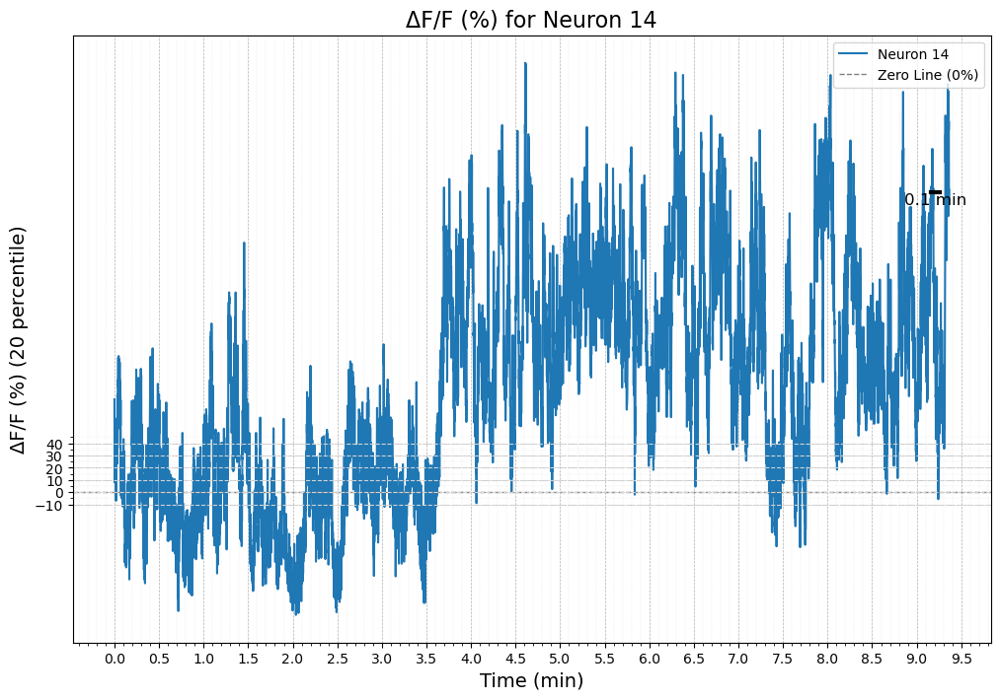

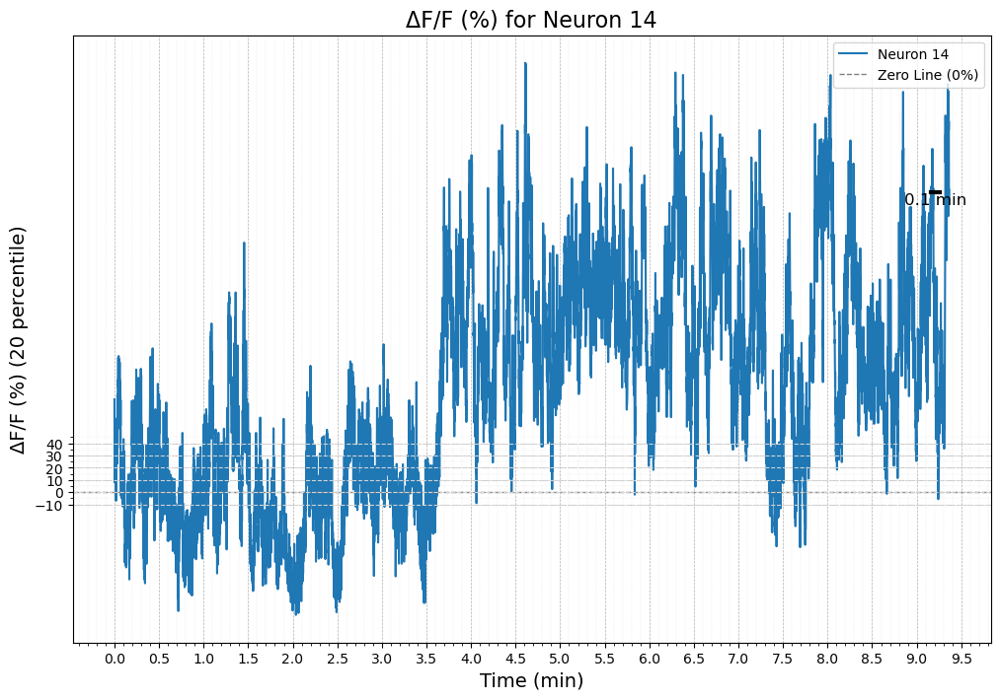

...

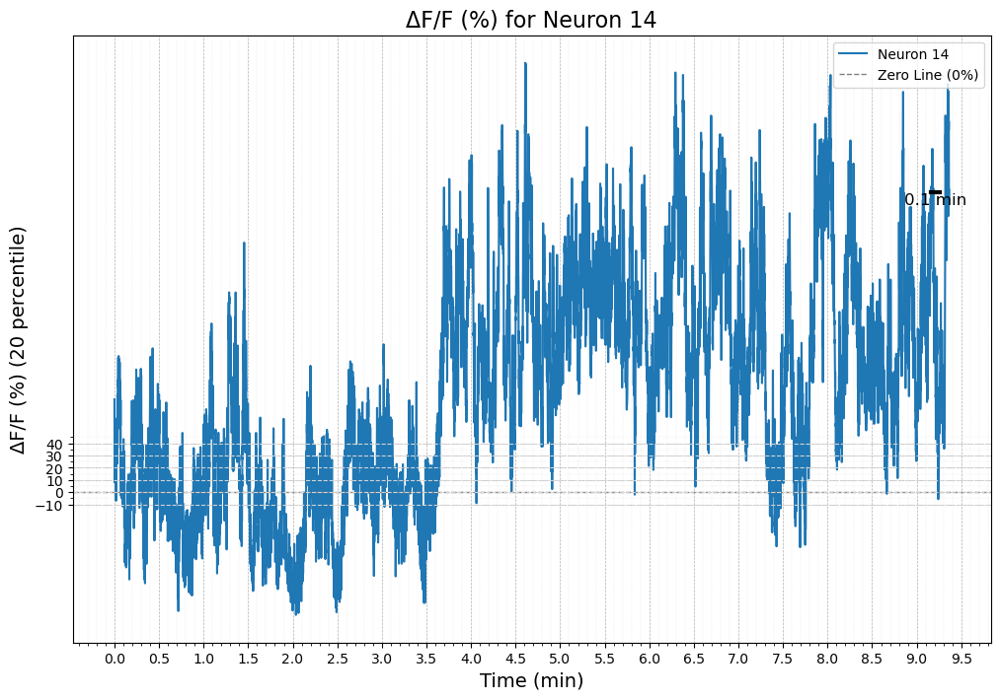

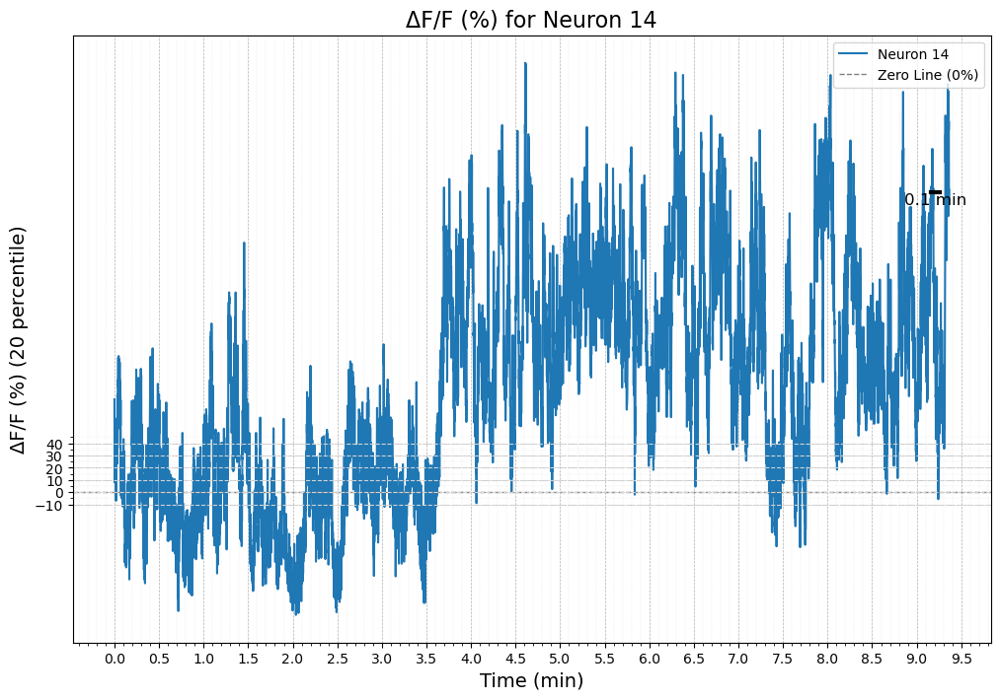

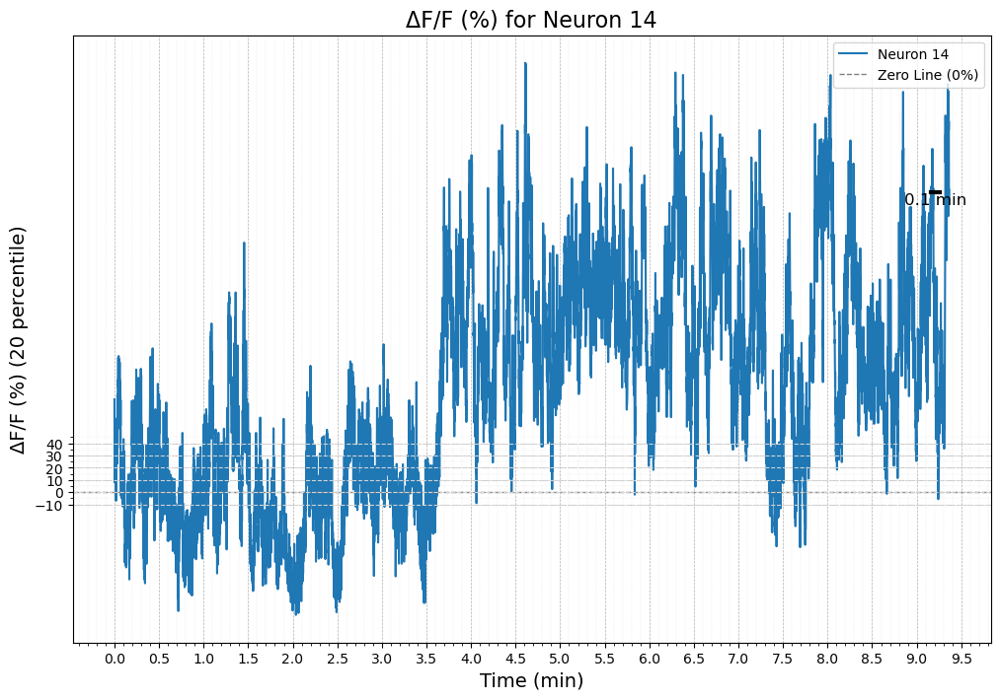

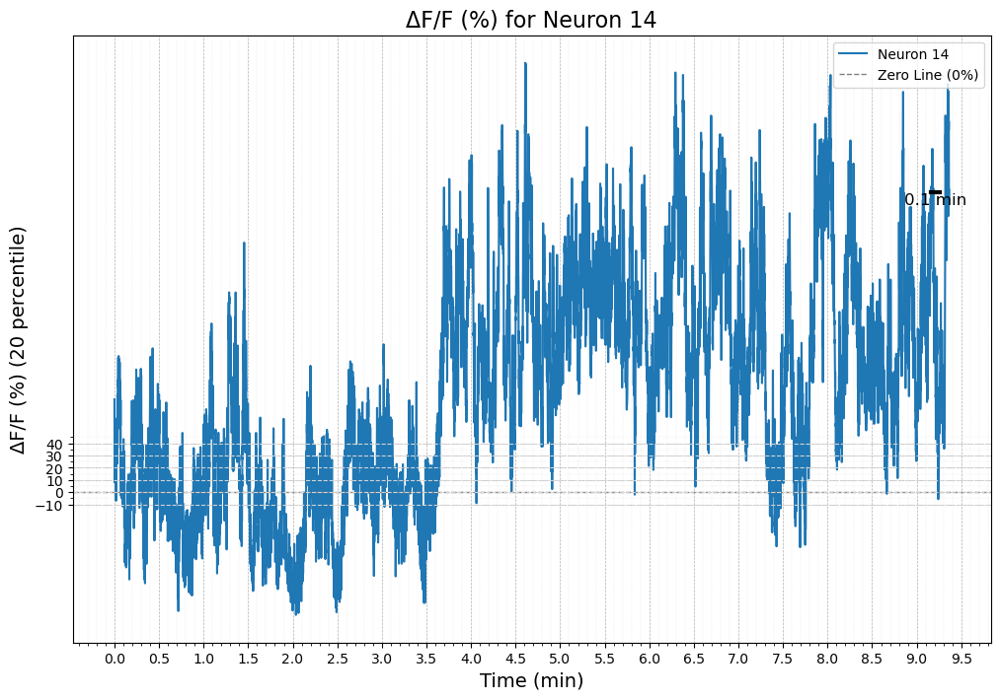

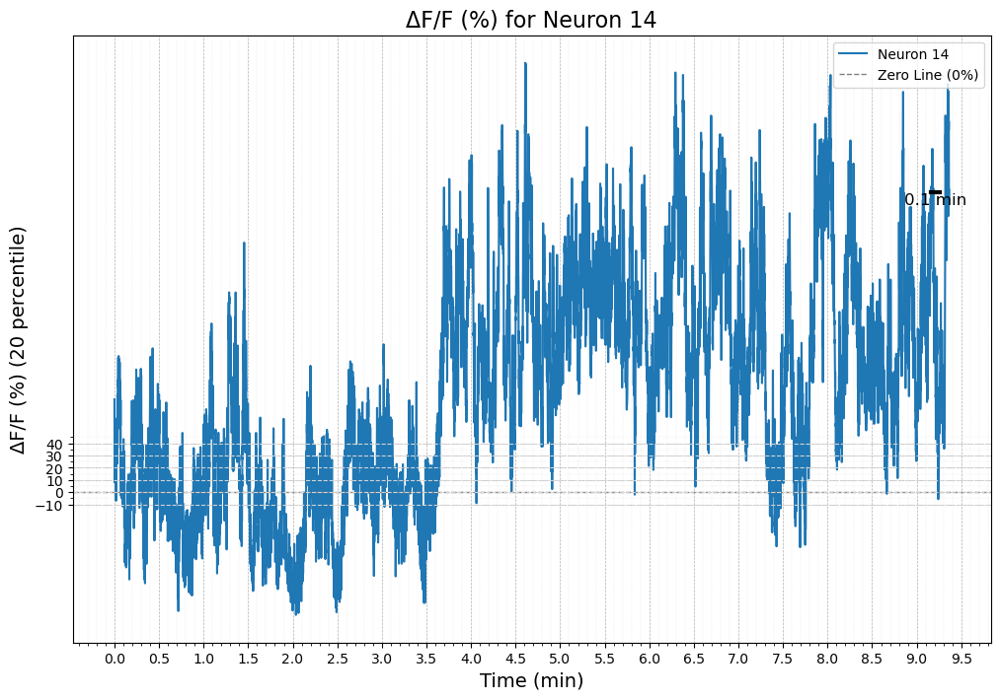

Top 20 neuron indices by mean ΔF/F value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [37]:
import matplotlib.patches as patches
import numpy as np

# Convert time units to minutes
time_unit = 'min'  # Time is displayed in minutes
ts_in_minutes = ts / 1000 / 60  # Convert from milliseconds to minutes

manual_selection.append(14)
plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # Create a new figure for each neuron
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(ts_in_minutes, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    
    # Set x-axis label to minutes
    ax.set_xlabel('Time (min)', fontsize=14)  # Adjusted font size
    ax.set_ylabel('ΔF/F (%) (20 percentile)', fontsize=14)  # Adjusted font size
    ax.set_title(f'ΔF/F (%) for Neuron {neuron_index}', fontsize=16)  # Adjusted font size for the title
    
    # Add a zero line (horizontal line at 0% ΔF/F)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1, label='Zero Line (0%)')

    # Turn on the minor ticks to create subgrids
    ax.minorticks_on()

    # Add more grid lines
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)  # Major and minor grids with dashed lines

    # Customize the appearance of the minor grid
    ax.grid(True, which='minor', color='lightgray', linestyle=':', linewidth=0.3)  # Dotted lines for minor grids

    # Optional: You can add additional horizontal lines at intervals to help read the peak values
    peak_value_lines = range(-10, 50, 10)  # Add lines every 10% ΔF/F from -10% to 50%
    for line in peak_value_lines:
        ax.axhline(line, color='lightgray', linestyle='--', linewidth=0.8)  # Lighter lines for peak references

    # Set more frequent ticks on both axes
    x_major_ticks = np.arange(np.floor(ts_in_minutes.min()), np.ceil(ts_in_minutes.max()) + 1, 0.5)  # Major ticks every 0.5 minutes
    x_minor_ticks = np.arange(np.floor(ts_in_minutes.min()), np.ceil(ts_in_minutes.max()) + 1, 0.1)  # Minor ticks every 0.1 minutes
    y_major_ticks = np.arange(-10, 50, 10)  # Major ticks every 10% ΔF/F
    y_minor_ticks = np.arange(-10, 50, 5)   # Minor ticks every 5% ΔF/F

    ax.set_xticks(x_major_ticks)
    ax.set_xticks(x_minor_ticks, minor=True)
    ax.set_yticks(y_major_ticks)
    ax.set_yticks(y_minor_ticks, minor=True)

    # Add legend
    legend = ax.legend(loc='upper right')

    # Add a more prominent scale bar in the same area as the legend
    scalebar_length_min = 0.1  # Define length of the scale bar in minutes
    scalebar_height_percent = 2  # Define the height offset for the scale bar in ΔF/F (%)
    
    # Draw the figure to render the plot and legend (necessary for the renderer)
    fig.canvas.draw()

    # Get legend position for reference
    legend_box = legend.get_window_extent(renderer=fig.canvas.get_renderer())
    
    # Get axis limits
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    
    # Place the scale bar near the top right, same height as the neuron label
    scalebar_x = ts_in_minutes[-1] - scalebar_length_min - 0.1  # Adjust the x position
    scalebar_y = dF_F[neuron_index][-1] * 100 - scalebar_height_percent

    # Add horizontal scale bar
    ax.plot([scalebar_x, scalebar_x + scalebar_length_min], [scalebar_y, scalebar_y], 
             color='black', lw=3)  # Thicker line for better visibility

    # Add label for the scale bar
    ax.text(scalebar_x + scalebar_length_min / 2, scalebar_y - 0.5, f'{scalebar_length_min} min', 
            ha='center', va='top', fontsize=12, color='black')

    # Adjust the font size of the tick labels on both axes
    ax.tick_params(axis='both', which='major', labelsize=10)  # Smaller font for major ticks
    ax.tick_params(axis='both', which='minor', labelsize=8)   # Even smaller font for minor ticks

    # Show the plot
    plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


<Figure size 1200x800 with 0 Axes>

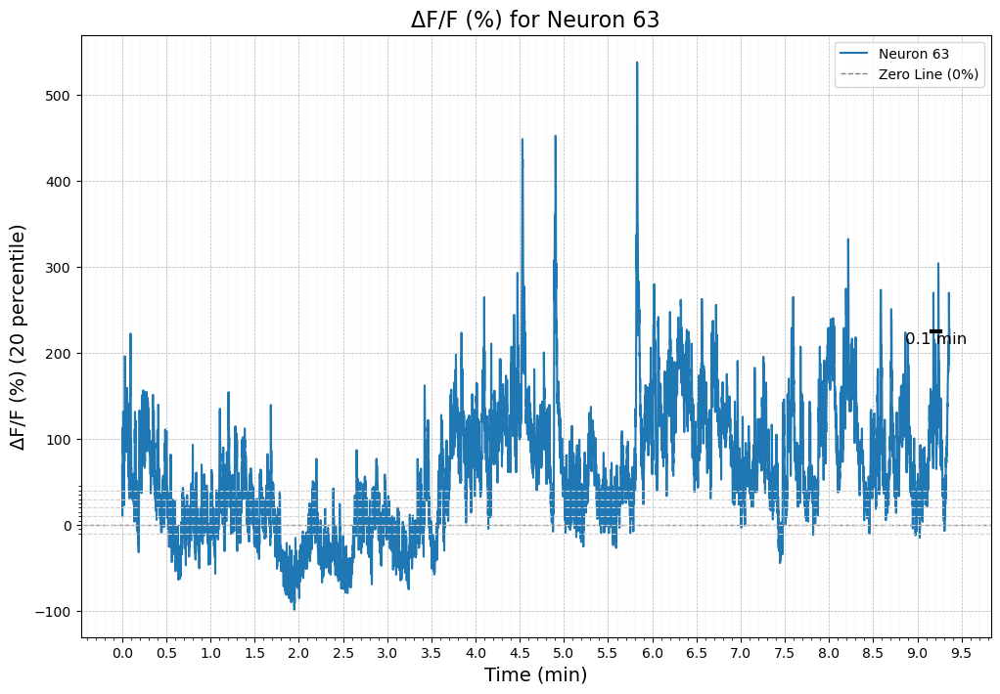

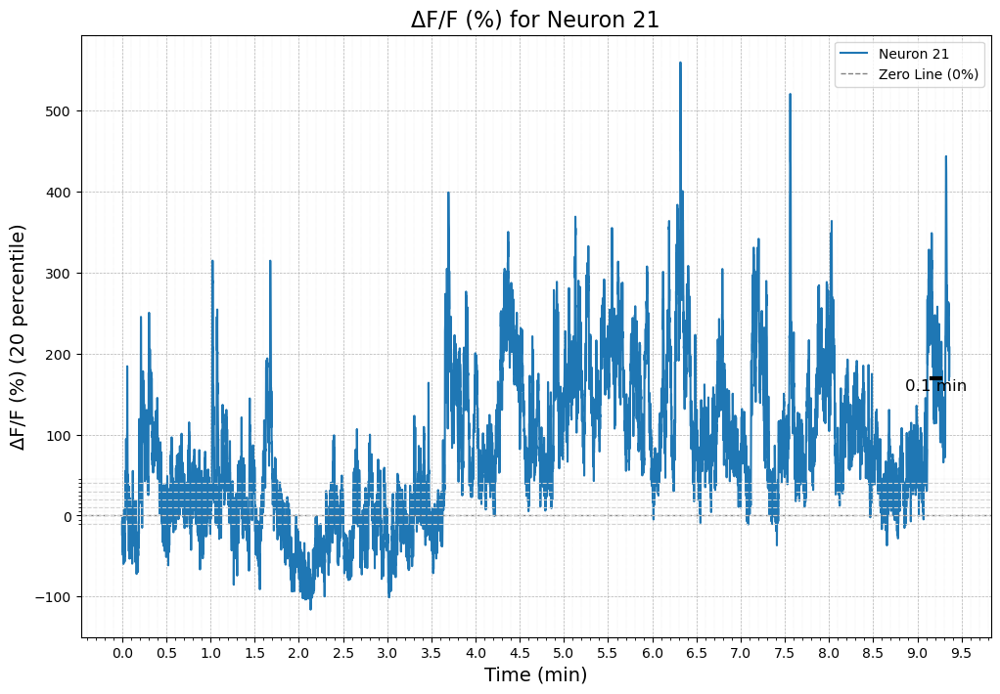

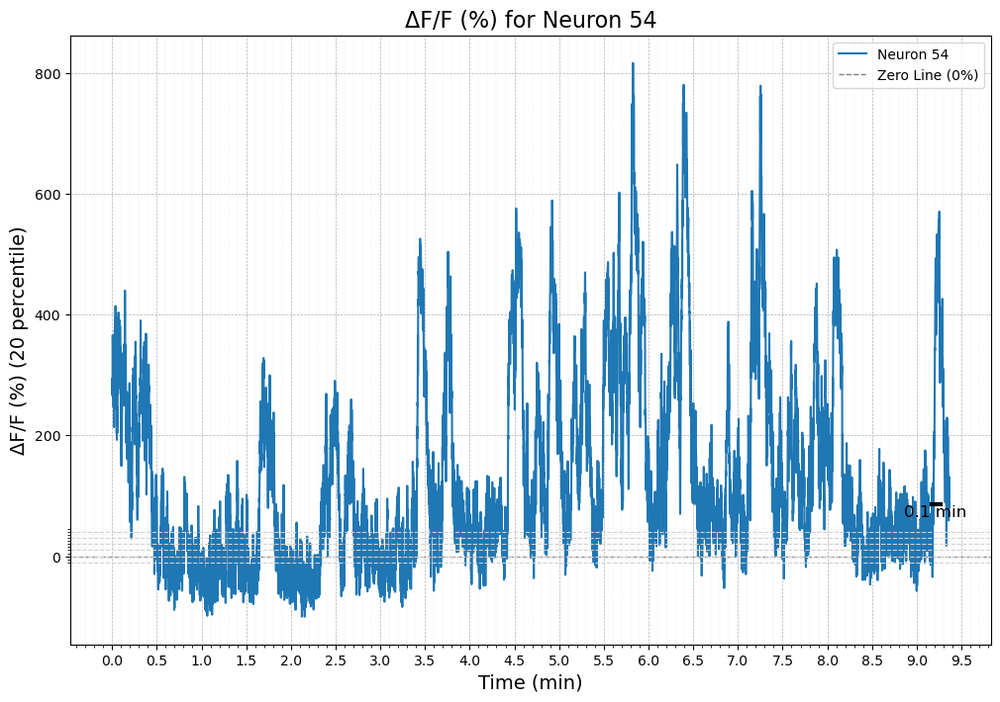

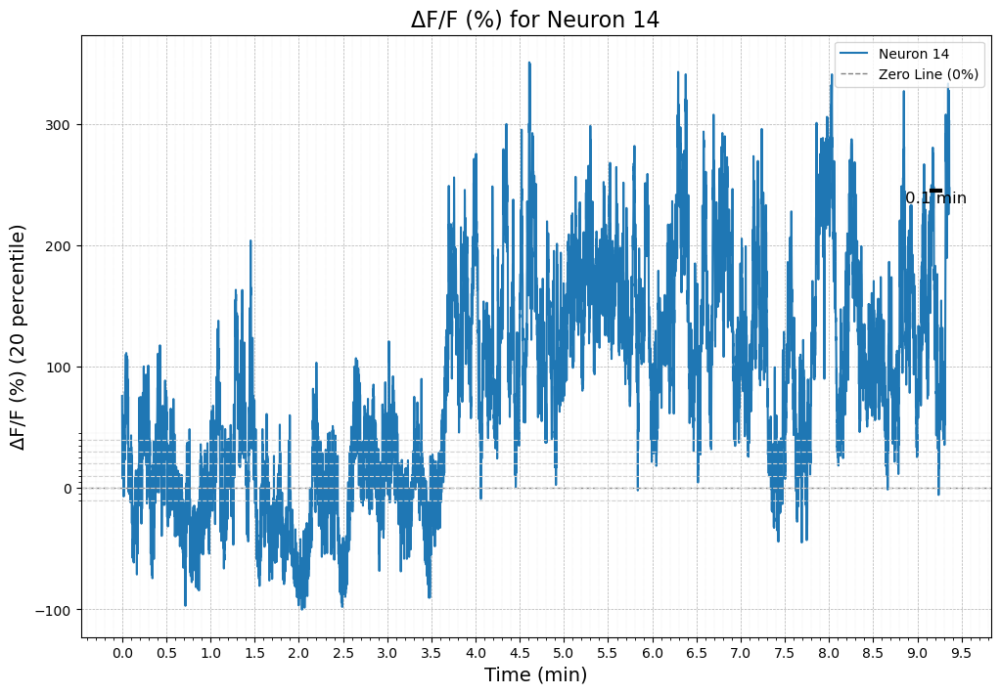

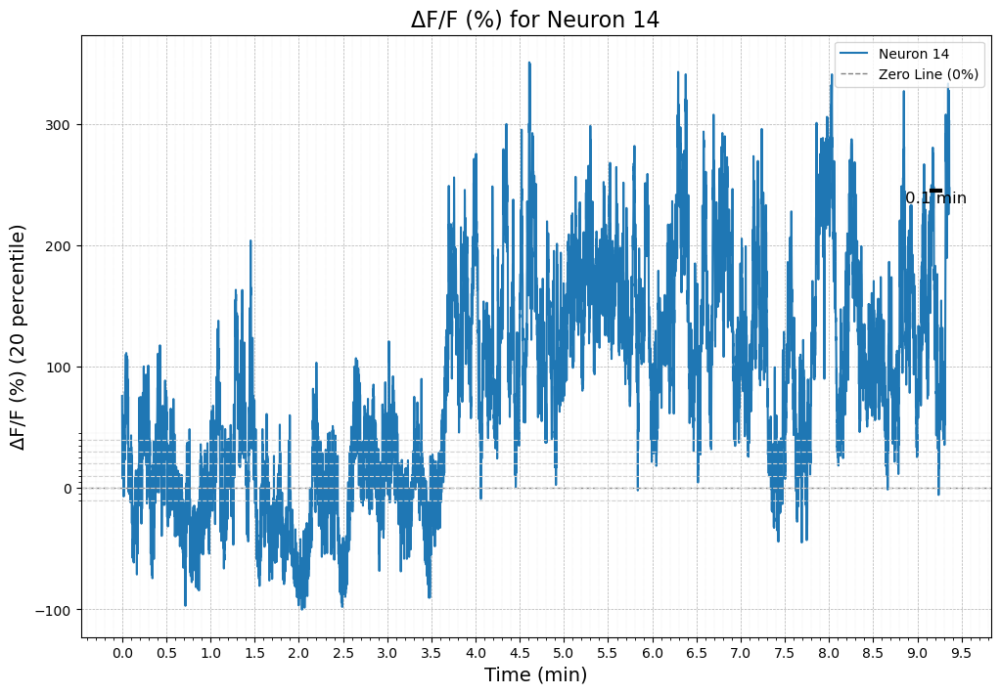

...

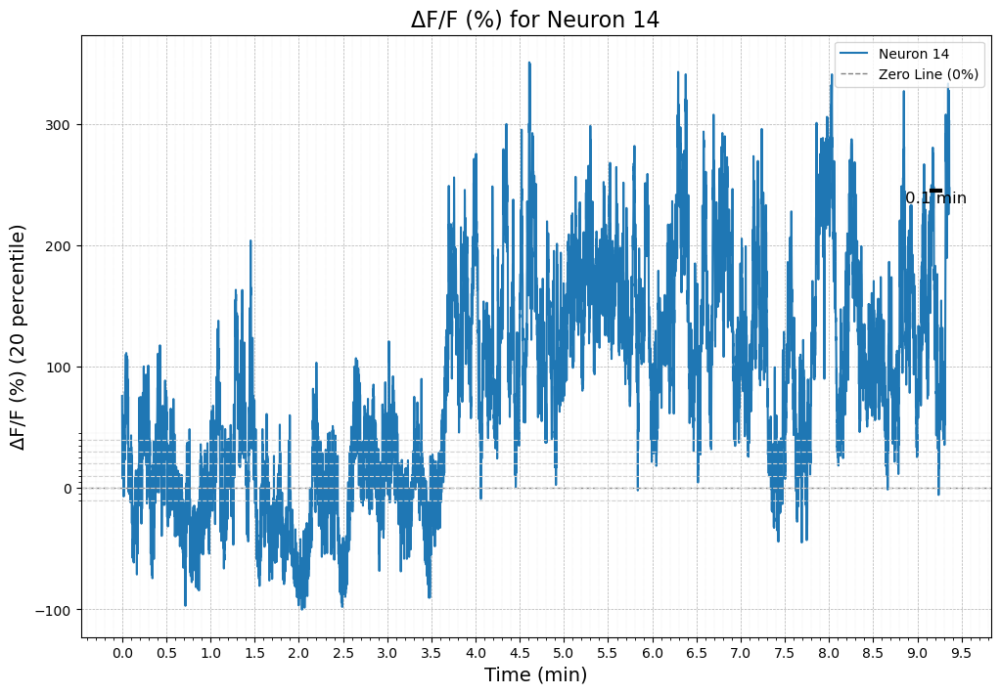

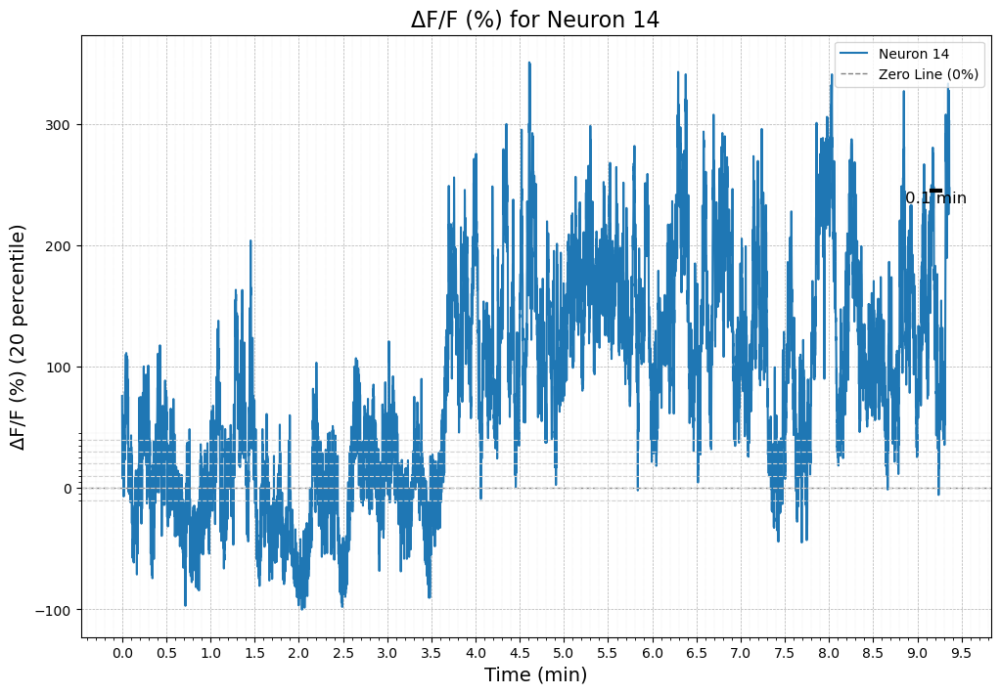

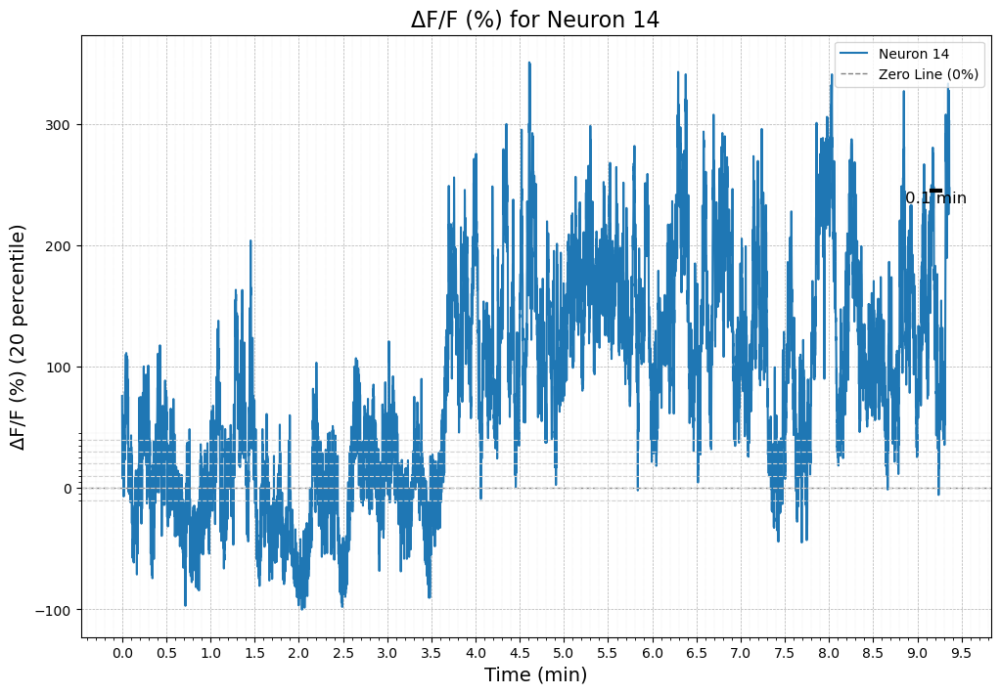

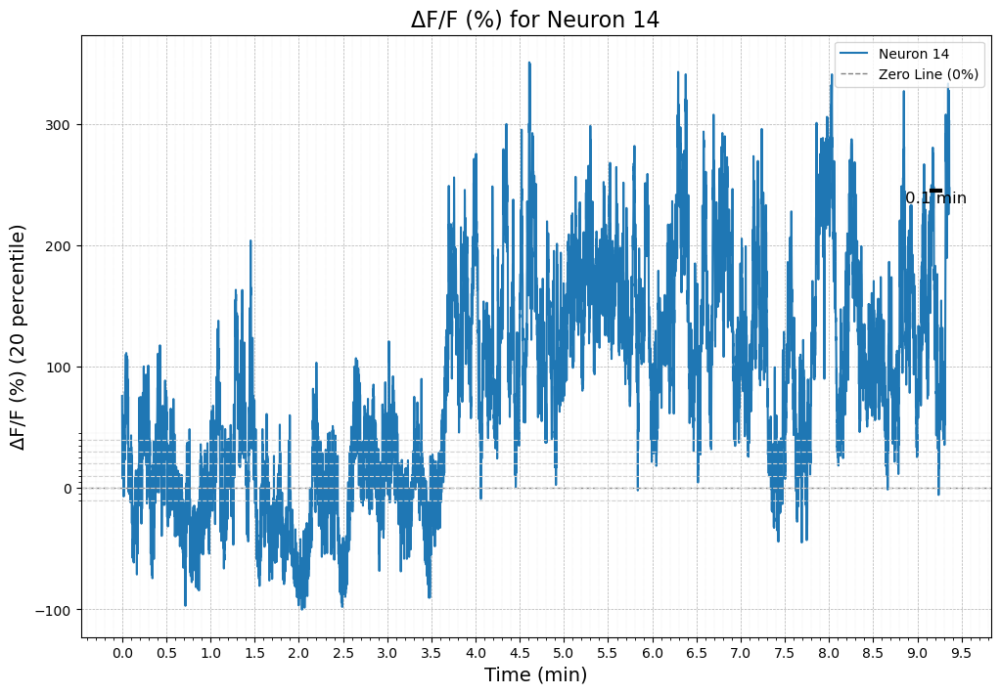

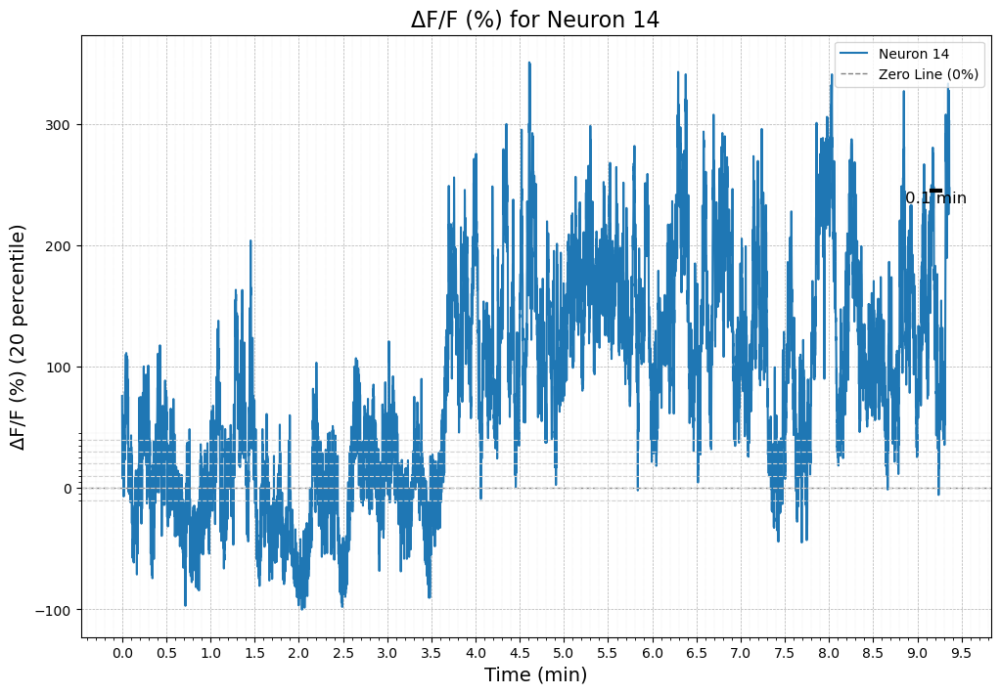

Top 20 neuron indices by mean ΔF/F value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [38]:
import matplotlib.patches as patches
import numpy as np

# Convert time units to minutes
time_unit = 'min'  # Time is displayed in minutes
ts_in_minutes = ts / 1000 / 60  # Convert from milliseconds to minutes

manual_selection.append(14)
plt.figure(figsize=(12, 8))
# for neuron_index in selected_indices:
for neuron_index in manual_selection:
    # Create a new figure for each neuron
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(ts_in_minutes, dF_F[neuron_index] * 100, label=f'Neuron {neuron_index}')  # No shifting, multiplied by 100 for percentage
    
    # Set x-axis label to minutes
    ax.set_xlabel('Time (min)', fontsize=14)  # Adjusted font size
    ax.set_ylabel('ΔF/F (%) (20 percentile)', fontsize=14)  # Adjusted font size
    ax.set_title(f'ΔF/F (%) for Neuron {neuron_index}', fontsize=16)  # Adjusted font size for the title
    
    # Add a zero line (horizontal line at 0% ΔF/F)
    ax.axhline(0, color='gray', linestyle='--', linewidth=1, label='Zero Line (0%)')

    # Turn on the minor ticks to create subgrids
    ax.minorticks_on()

    # Add more grid lines
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)  # Major and minor grids with dashed lines

    # Customize the appearance of the minor grid
    ax.grid(True, which='minor', color='lightgray', linestyle=':', linewidth=0.3)  # Dotted lines for minor grids

    # Optional: You can add additional horizontal lines at intervals to help read the peak values
    peak_value_lines = range(-10, 50, 10)  # Add lines every 10% ΔF/F from -10% to 50%
    for line in peak_value_lines:
        ax.axhline(line, color='lightgray', linestyle='--', linewidth=0.8)  # Lighter lines for peak references

    # Set more frequent ticks on the x-axis
    x_major_ticks = np.arange(np.floor(ts_in_minutes.min()), np.ceil(ts_in_minutes.max()) + 1, 0.5)  # Major ticks every 0.5 minutes
    x_minor_ticks = np.arange(np.floor(ts_in_minutes.min()), np.ceil(ts_in_minutes.max()) + 1, 0.1)  # Minor ticks every 0.1 minutes
    ax.set_xticks(x_major_ticks)
    ax.set_xticks(x_minor_ticks, minor=True)

    # Set more frequent ticks on the y-axis, but keep existing major tick values
    y_major_ticks = ax.get_yticks()  # Keep the existing major y-tick values
    y_minor_ticks = np.arange(-10, 50, 5)   # Minor ticks every 5% ΔF/F
    ax.set_yticks(y_major_ticks)  # Set back the major ticks
    ax.set_yticks(y_minor_ticks, minor=True)  # Add the minor ticks

    # Add legend
    legend = ax.legend(loc='upper right')

    # Add a more prominent scale bar in the same area as the legend
    scalebar_length_min = 0.1  # Define length of the scale bar in minutes
    scalebar_height_percent = 2  # Define the height offset for the scale bar in ΔF/F (%)
    
    # Draw the figure to render the plot and legend (necessary for the renderer)
    fig.canvas.draw()

    # Get legend position for reference
    legend_box = legend.get_window_extent(renderer=fig.canvas.get_renderer())
    
    # Get axis limits
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    
    # Place the scale bar near the top right, same height as the neuron label
    scalebar_x = ts_in_minutes[-1] - scalebar_length_min - 0.1  # Adjust the x position
    scalebar_y = dF_F[neuron_index][-1] * 100 - scalebar_height_percent

    # Add horizontal scale bar
    ax.plot([scalebar_x, scalebar_x + scalebar_length_min], [scalebar_y, scalebar_y], 
             color='black', lw=3)  # Thicker line for better visibility

    # Add label for the scale bar
    ax.text(scalebar_x + scalebar_length_min / 2, scalebar_y - 0.5, f'{scalebar_length_min} min', 
            ha='center', va='top', fontsize=12, color='black')

    # Adjust the font size of the tick labels on both axes
    ax.tick_params(axis='both', which='major', labelsize=10)  # Smaller font for major ticks
    ax.tick_params(axis='both', which='minor', labelsize=8)   # Even smaller font for minor ticks

    # Show the plot
    plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)


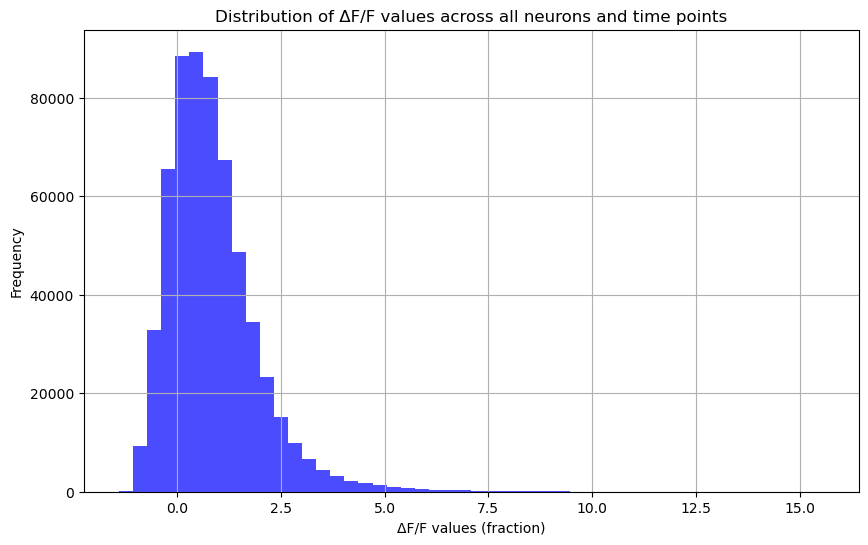

In [52]:
# Flatten the dF_F array to get all values for all neurons and time points
flattened_dF_F = dF_F.flatten()

# Create a histogram of the ΔF/F values
plt.figure(figsize=(10, 6))
plt.hist(flattened_dF_F, bins=50, color='blue', alpha=0.7)  # 50 bins for the histogram
plt.xlabel('ΔF/F values (fraction)')
plt.ylabel('Frequency')
plt.title('Distribution of ΔF/F values across all neurons and time points')
plt.grid(True)
plt.show()


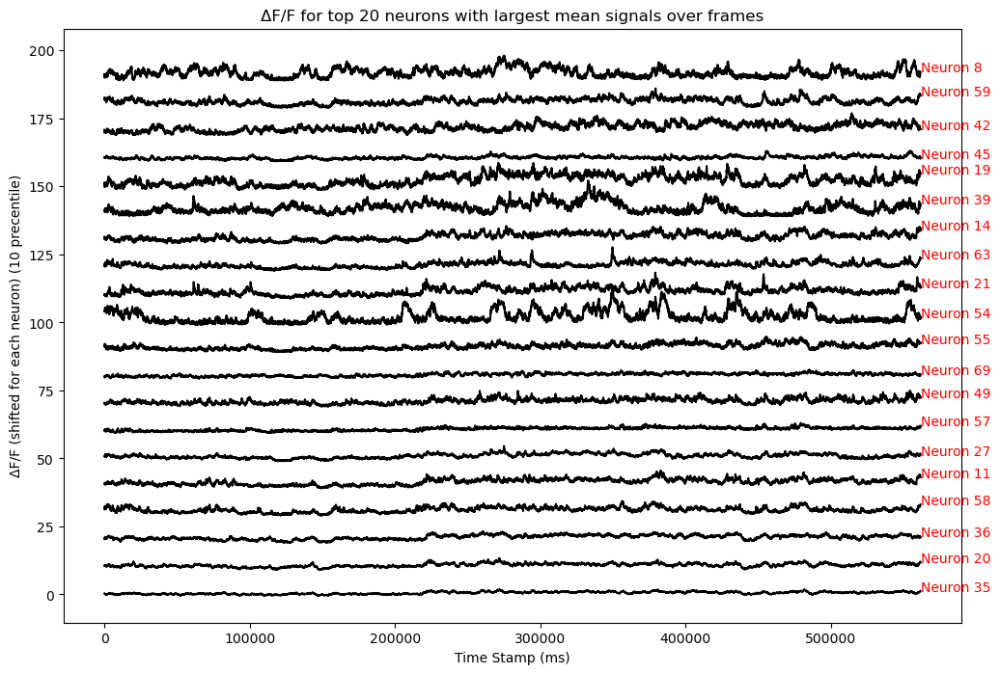

Top 20 neuron indices by mean ΔF/F (10 precentile) value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [38]:
# Calculate F0 (the baseline) for each neuron as the 10th percentile of fluorescence
F0 = np.percentile(C, 10, axis=1, keepdims=True)

# Calculate ΔF/F for each neuron
dF_F = (C - F0) / F0

# Plot the ΔF/F values for each selected neuron and print their indices for manual selection, with timestamps
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(ts, dF_F[neuron_index] + i * 10, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
    plt.text(ts[-1], dF_F[neuron_index][-1] + i * 10, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index

plt.xlabel('Time Stamp (ms)')
plt.ylabel('ΔF/F (shifted for each neuron) (10 precentile)')
plt.title('ΔF/F for top 20 neurons with largest mean signals over frames')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F (10 precentile) value:")
print(selected_indices)


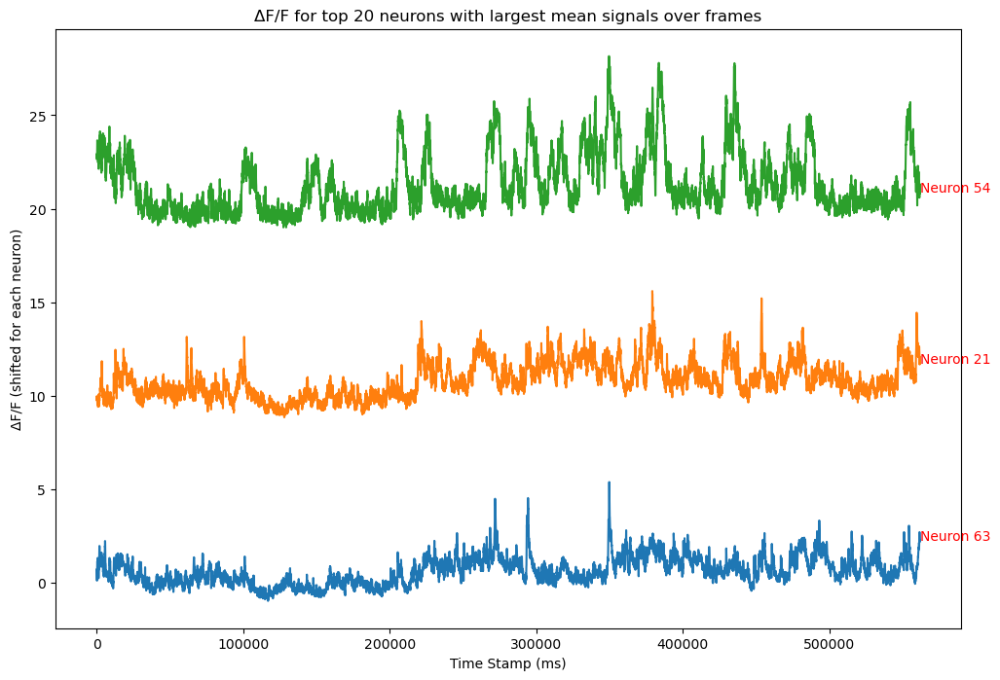

Top 20 neuron indices by mean ΔF/F value:
[63, 21, 54]


In [30]:
# Plot the ΔF/F values for each selected neuron and print their indices for manual selection, with timestamps
selected_indices = [63, 21, 54]
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(ts, dF_F[neuron_index] + i * 10, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
    plt.text(ts[-1], dF_F[neuron_index][-1] + i * 10, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index

plt.xlabel('Time Stamp (ms)')
plt.ylabel('ΔF/F (shifted for each neuron)')
plt.title('ΔF/F for top 20 neurons with largest mean signals over frames')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean ΔF/F value:")
print(selected_indices)

In [8]:
# # Load the data from the .nc file using xarray
# file_path = '/home/lq53/mir_data/miniscope_vid_transfer/240603_rec/20240506PMC1-left/minian_dataset_after1st_spatial_raw_inpath_strict.nc'
# # file_path = '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/minian_dataset_after1st_spatial_raw_inpath_strict.nc'  # Replace with your actual file path
# data = xr.open_dataset(file_path)

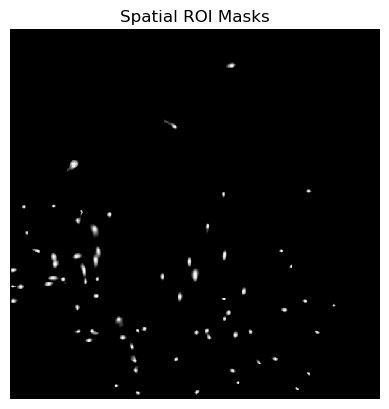

In [15]:
# import h5py
A = np.array(data['A'].values)

try:
    # Convert from sparse to dense if necessary (CSC or CSR format typically)
    from scipy.sparse import csc_matrix
    A_dense = csc_matrix((A.data, A.indices, A.indptr), shape=A.shape).toarray()
except AttributeError:
    # If 'A' is already dense
    A_dense = A

# Sum along the first axis to create a binary image of all ROIs
# This assumes non-overlapping ROIs; if ROIs overlap, this will show overlap areas as brighter
all_rois = np.clip(np.sum(A_dense, axis=0), 0, 1)

# Plot the binary image
# plt.figure(figsize=(10, 10))
plt.imshow(all_rois, cmap='gray', interpolation='nearest')
plt.title('Spatial ROI Masks')
plt.axis('off')  # Turn off axis labels and ticks
plt.show()

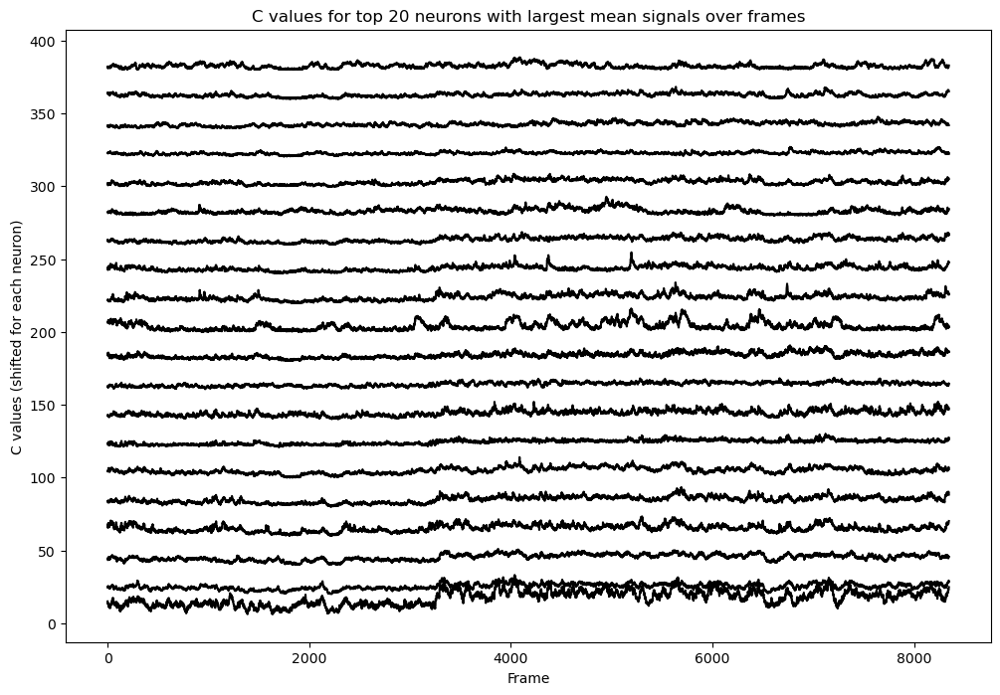

In [16]:
# # this method have a better shifting pattern, thus looks different.
# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Calculate the mean across frames for each neuron
# mean_C = np.mean(C, axis=1)

# # Get the indices that would sort the neurons by their mean values in descending order
# sorted_indices = np.argsort(mean_C)[::-1]

# # Select the top 10-20 neurons (here we choose 20)
# top_neurons = 20
# selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 20, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()

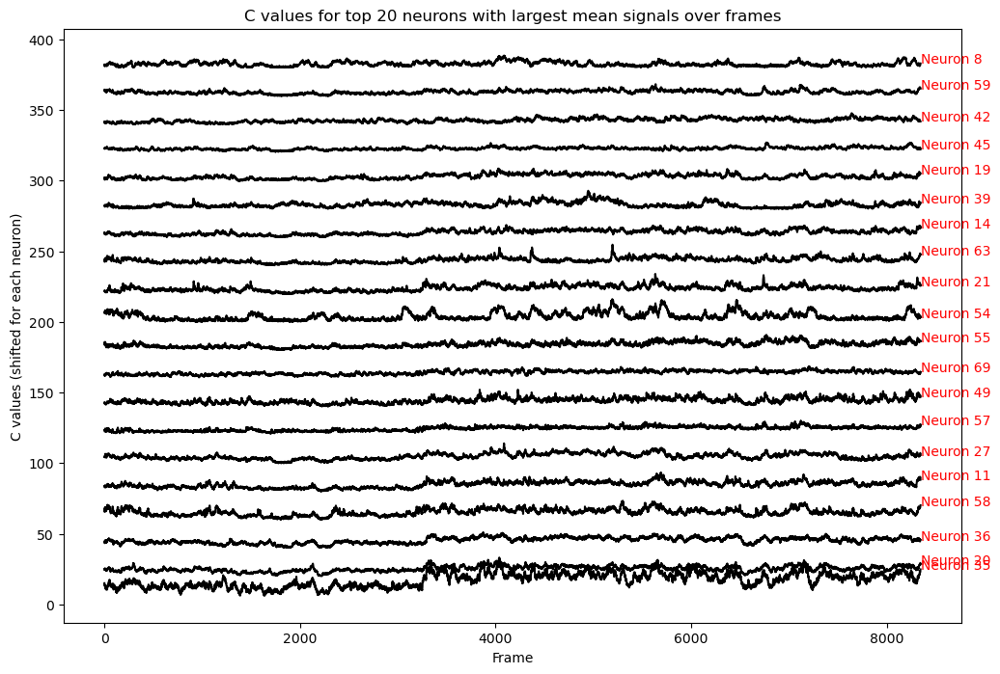

Top 20 neuron indices by mean value:
[35 20 36 58 11 27 57 49 69 55 54 21 63 14 39 19 45 42 59  8]


In [17]:
# Plot the C values for each selected neuron and print their indices for manual selection
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(C[neuron_index] + i * 20, color='black', label=f'Neuron {neuron_index}')  # Set the color to black
    plt.text(num_frame - 1, C[neuron_index][-1] + i * 20, f'Neuron {neuron_index}', color='red')  # Annotate each neuron index

plt.xlabel('Frame')
plt.ylabel('C values (shifted for each neuron)')
plt.title('C values for top 20 neurons with largest mean signals over frames')
plt.show()

# Print the selected neuron indices for reference
print("Top 20 neuron indices by mean value:")
print(selected_indices)




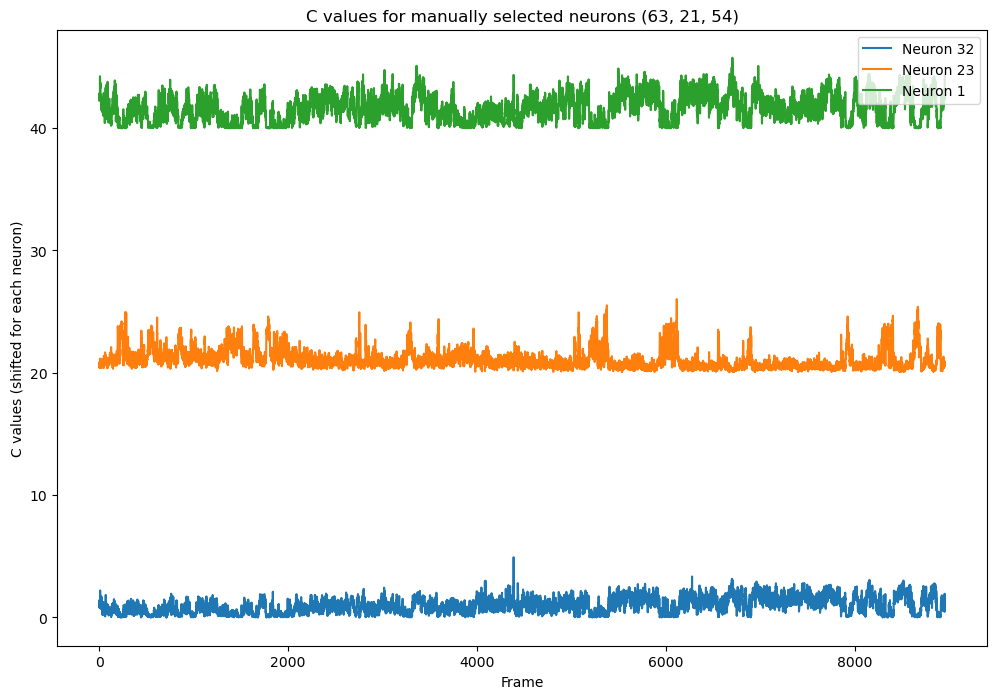

In [11]:
# Assuming these are actual neuron values, not the indices in selected_indices
manual_selection = [32, 23, 1]

# Plot the C values for the manually selected neurons
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(manual_selection):
    plt.plot(C[neuron_index] + i * 20, label=f'Neuron {neuron_index}')  # Add label for each neuron

plt.xlabel('Frame')
plt.ylabel('C values (shifted for each neuron)')
plt.title('C values for manually selected neurons (63, 21, 54)')
plt.legend(loc='upper right')
plt.show()

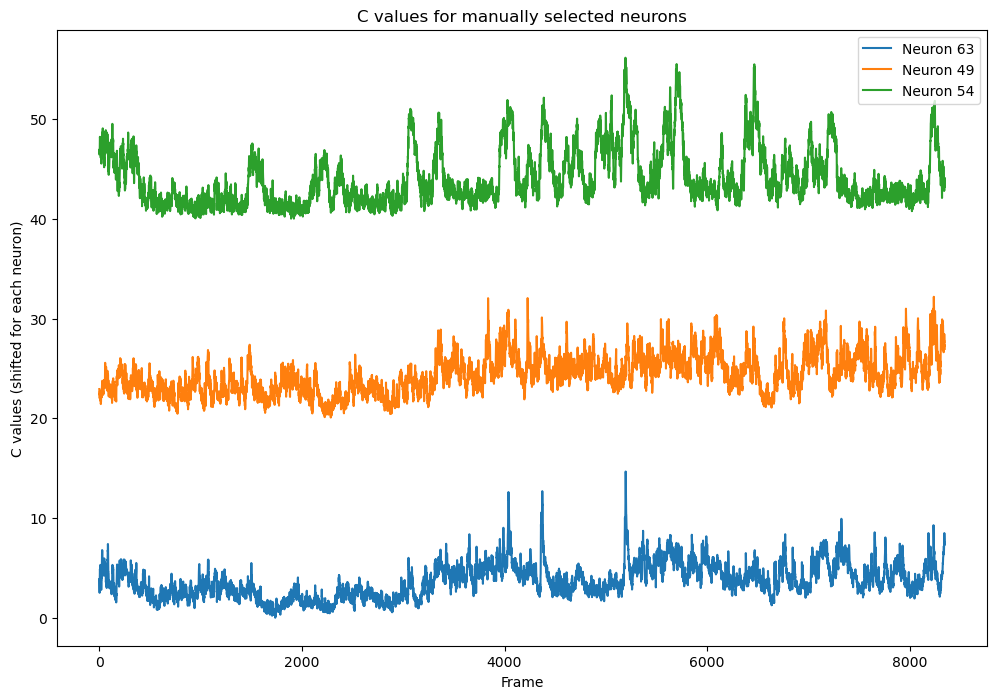

In [23]:
# # Manually select the neurons you want to plot (e.g., enter the indices of the 5 neurons you'd like to focus on)
# selected_five_neurons = [selected_indices[12], selected_indices[7], selected_indices[10]]  # example selection , selected_indices[10], selected_indices[15]

# # Plot the C values for the manually selected neurons
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_five_neurons):
#     plt.plot(C[neuron_index] + i * 20, label=f'Neuron {neuron_index}')  # Add label for each neuron

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for manually selected neurons')
# plt.legend(loc='upper right')
# plt.show()

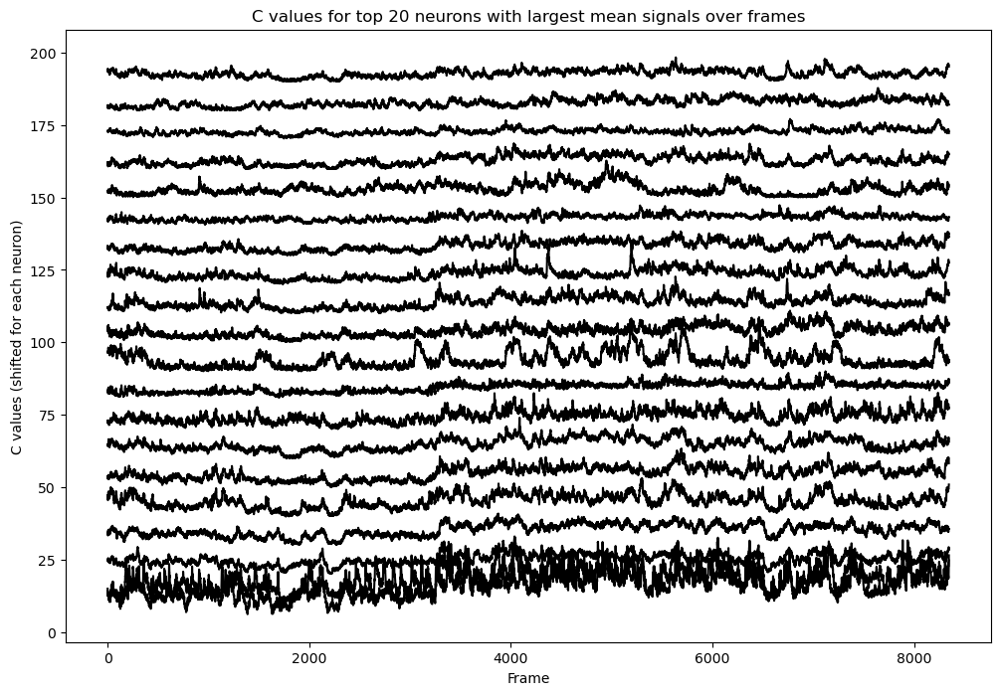

In [10]:
# # Load the data from the .nc file using xarray
# # file_path = '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/minian_dataset_after1st_spatial_raw_inpath_strict.nc'  # Replace with your actual file path
# data = xr.open_dataset(file_path)
# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Calculate the mean across frames for each neuron
# mean_C = np.mean(C, axis=1)

# # Get the indices that would sort the neurons by their mean values in descending order
# sorted_indices = np.argsort(mean_C)[::-1]

# # Select the top 10-20 neurons (here we choose 20)
# top_neurons = 20
# selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 10, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()

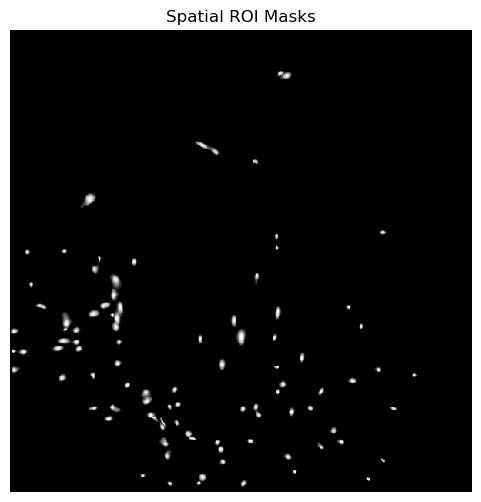

In [6]:
# import matplotlib.pyplot as plt

# # Assume all_rois is your binary ROI image as previously calculated

# # Set the DPI so that the figure size results in a 600x600 pixel image
# dpi = 100  # DPI (dots per inch)
# pixel_size = 600  # Size in pixels you want for width and height

# # Calculate the figsize in inches for a 600x600 pixel image
# figsize = pixel_size / float(dpi), pixel_size / float(dpi)

# plt.figure(figsize=figsize, dpi=dpi)
# plt.imshow(all_rois, cmap='gray', interpolation='nearest')
# plt.title('Spatial ROI Masks')
# plt.axis('off')  # Turn off axis labels and ticks
# plt.show()


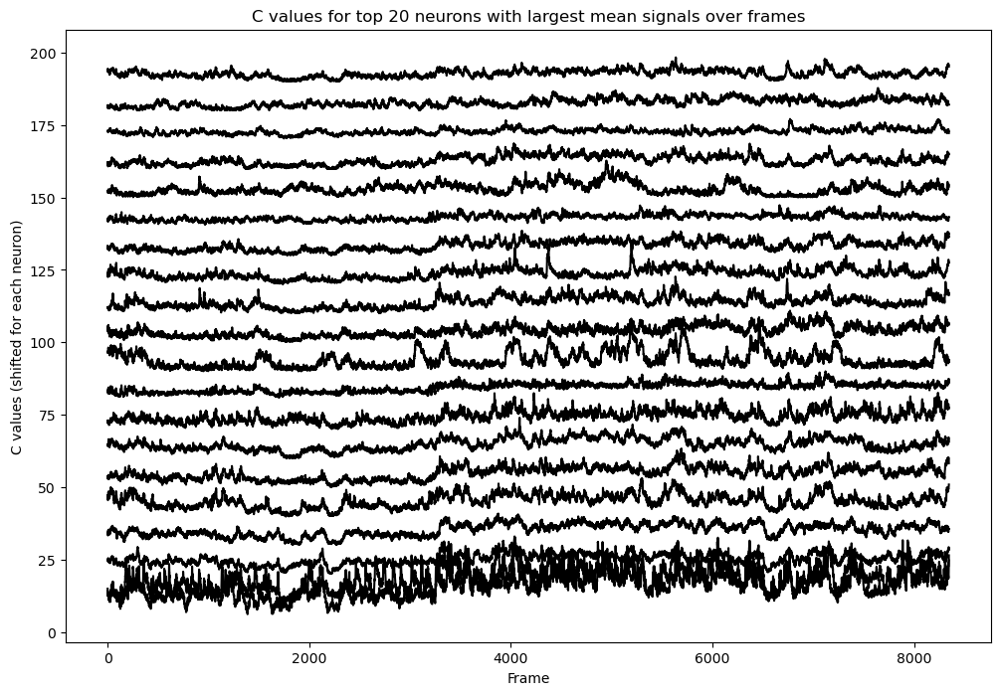

In [4]:
# # Load the data from the .nc file using xarray
# # file_path = '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/minian_dataset_after1st_spatial_raw_inpath_strict.nc'  # Replace with your actual file path
# data = xr.open_dataset(file_path)
# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Calculate the mean across frames for each neuron
# mean_C = np.mean(C, axis=1)

# # Get the indices that would sort the neurons by their mean values in descending order
# sorted_indices = np.argsort(mean_C)[::-1]

# # Select the top 10-20 neurons (here we choose 20)
# top_neurons = 20
# selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 10, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()

In [7]:
#overlay on origional vid, useless. need to be on motion corrected vid.
# import cv2
# import os

# # Directory containing videos
# video_directory = '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/My_V4_Miniscope'
# output_directory = '/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/My_V4_Miniscope/ROI'
# video_files = [f for f in os.listdir(video_directory) if f.endswith('.avi')]

# # Ensure the output directory exists
# if not os.path.exists(output_directory):
#     os.makedirs(output_directory)

# # Process each video
# for video_name in video_files:
#     input_video_path = os.path.join(video_directory, video_name)
#     output_video_path = os.path.join(output_directory, 'processed_' + video_name)

#     # Open the input video
#     cap = cv2.VideoCapture(input_video_path)
#     fps = cap.get(cv2.CAP_PROP_FPS)
#     frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
#     frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

#     # Define the codec and create a VideoWriter object to save the video
#     fourcc = cv2.VideoWriter_fourcc(*'XVID')
#     out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

#     while cap.isOpened():
#         ret, frame = cap.read()
#         if ret:
#             # Convert ROI mask to the same color format as the video
#             mask = np.stack((all_rois * 255,) * 3, axis=-1)  # Create an RGB version of the mask

#             # Apply the mask to the frame
#             overlay_frame = cv2.addWeighted(frame, 1, mask.astype(np.uint8), 0.5, 0)

#             # Write the frame into the file
#             out.write(overlay_frame)
#         else:
#             break

#     # Release everything when done
#     cap.release()
#     out.release()

# cv2.destroyAllWindows()

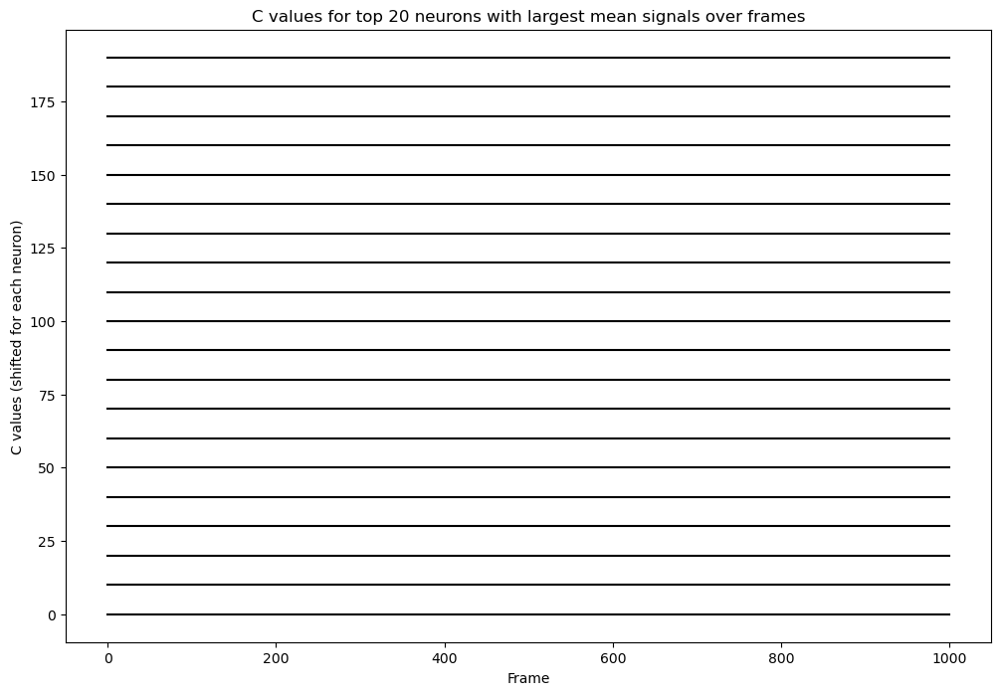

In [29]:
# Extract the 'C' variable
C = data['C'].values

# Get the number of neurons and frames
num_neuron, num_frame = C.shape

# Calculate the mean across frames for each neuron
mean_C = np.mean(C, axis=1)

# Get the indices that would sort the neurons by their mean values in descending order
sorted_indices = np.argsort(mean_C)[::-1]

# Select the top 10-20 neurons (here we choose 20)
top_neurons = 20
selected_indices = sorted_indices[:top_neurons]

# Plot the C values for each selected neuron
plt.figure(figsize=(12, 8))
for i, neuron_index in enumerate(selected_indices):
    plt.plot(C[neuron_index] + i * 10, color='black')  # Set the color to black

plt.xlabel('Frame')
plt.ylabel('C values (shifted for each neuron)')
plt.title('C values for top 20 neurons with largest mean signals over frames')
plt.show()

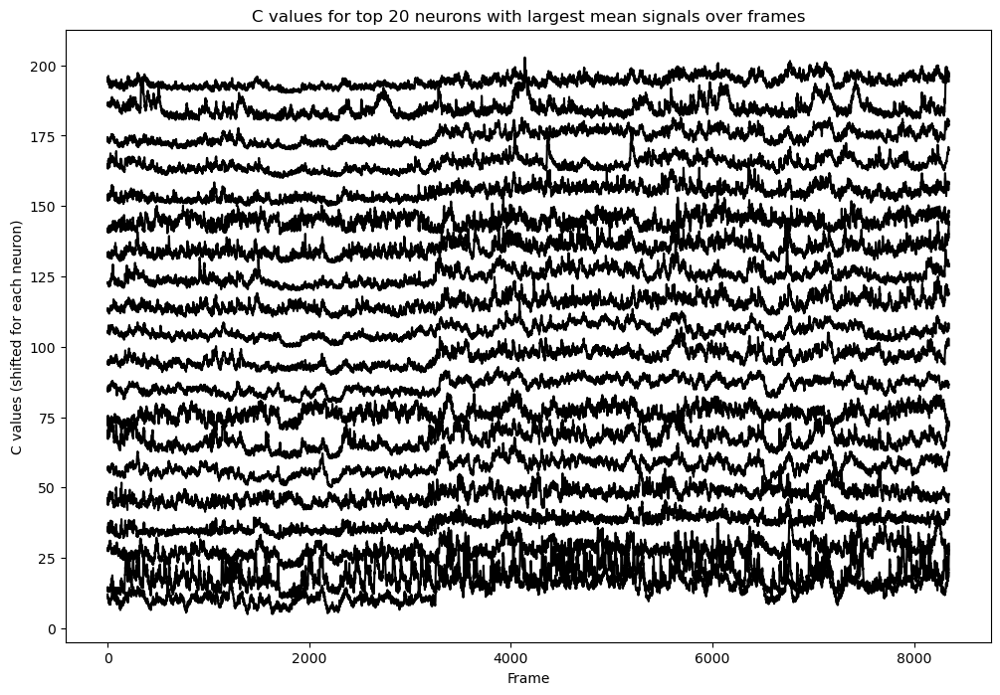

In [5]:
# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Calculate the mean across frames for each neuron
# mean_C = np.mean(C, axis=1)

# # Get the indices that would sort the neurons by their mean values in descending order
# sorted_indices = np.argsort(mean_C)[::-1]

# # Select the top 10-20 neurons (here we choose 20)
# top_neurons = 20
# selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 10, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()

In [7]:
# Extract the top 20 neuron traces
top_20_traces = C[selected_indices]

# Save the selected traces to a .npy file
np.save('/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/240603_rec_20240506PMC1-left_top_20_neuron_traces_strict.npy', top_20_traces)

In [8]:
# Save the entire traces to a .npy file
np.save('/hpc/group/tdunn/lq53/miniscope_vid_transfer/240603_rec/20240506PMC1-left/240603_rec_20240506PMC1-left_all_neuron_traces_strict.npy', C)

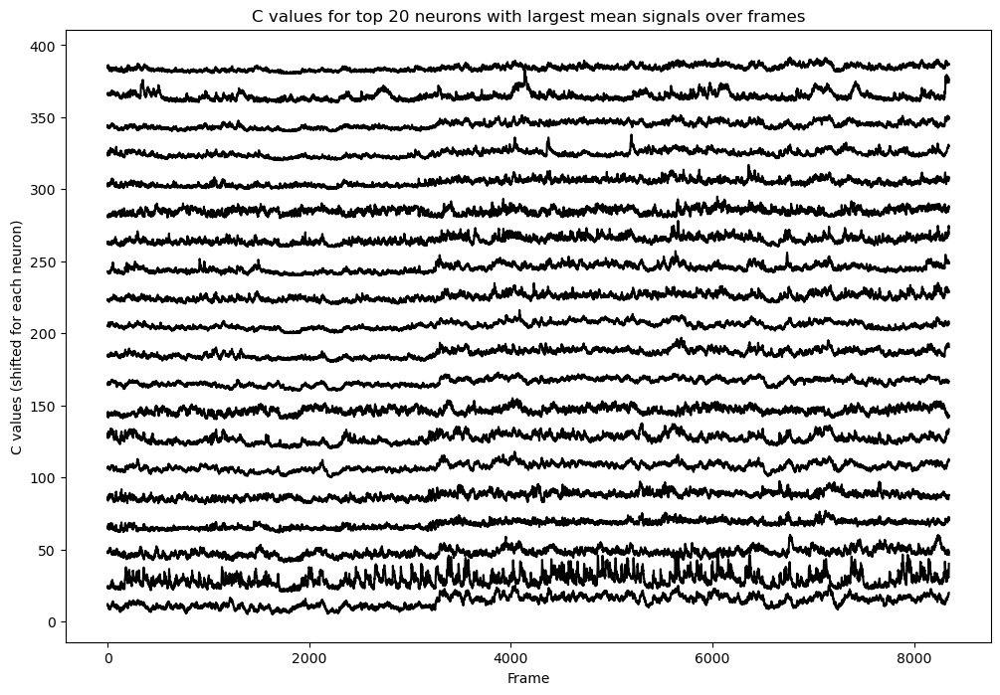

In [13]:
# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Calculate the mean across frames for each neuron
# mean_C = np.mean(C, axis=1)

# # Get the indices that would sort the neurons by their mean values in descending order
# sorted_indices = np.argsort(mean_C)[::-1]

# # Select the top 10-20 neurons (here we choose 20)
# top_neurons = 20
# selected_indices = sorted_indices[:top_neurons]

# # Plot the C values for each selected neuron
# plt.figure(figsize=(12, 8))
# for i, neuron_index in enumerate(selected_indices):
#     plt.plot(C[neuron_index] + i * 20, color='black')  # Set the color to black

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for top 20 neurons with largest mean signals over frames')
# plt.show()

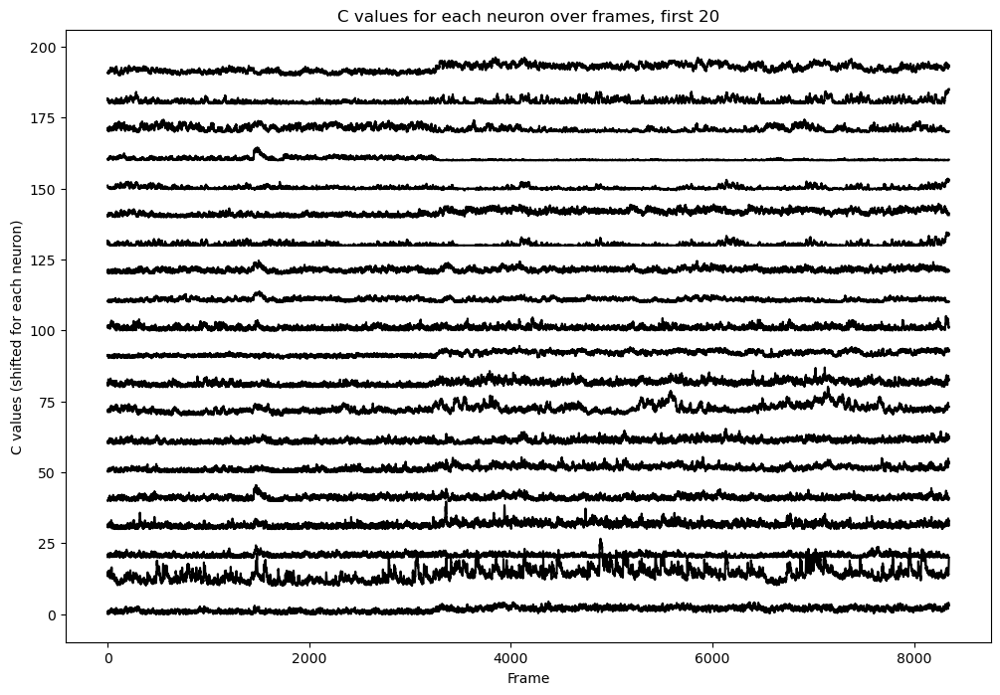

In [6]:

# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Plot the C values for each neuron
# plt.figure(figsize=(12, 8))
# # for i in range(num_neuron): #all
# for i in range(20):
#     plt.plot(C[i] + i * 10, color='black')

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for each neuron over frames, first 20')
# plt.show()

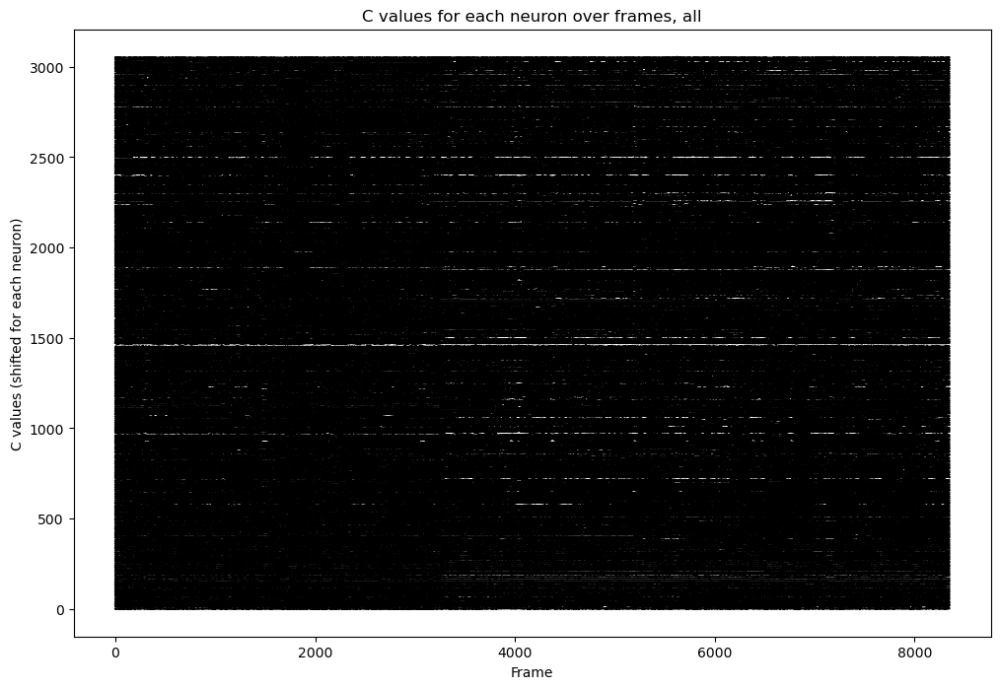

In [9]:

# # Extract the 'C' variable
# C = data['C'].values

# # Get the number of neurons and frames
# num_neuron, num_frame = C.shape

# # Plot the C values for each neuron
# plt.figure(figsize=(12, 8))
# for i in range(num_neuron): #all
# # for i in range(20):
#     plt.plot(C[i] + i * 10, color='black')

# plt.xlabel('Frame')
# plt.ylabel('C values (shifted for each neuron)')
# plt.title('C values for each neuron over frames, all')
# plt.show()